##### Setup

In [3]:
pip install holidays

In [4]:
import pandas as pd
import numpy as np
import re


import holidays
from datetime import datetime


import geopandas as gpd
from shapely.geometry import Point

In [5]:
base_path = 'drive/MyDrive/data_607/project/data'

In [6]:
%pwd


'/content'

##### Data Loading + Cleaning

In [7]:
# Load CSV files
incidents_raw_df = pd.read_csv(base_path + "/Traffic_Incidents.csv")
st_centreline_raw_df = pd.read_csv(base_path + "/Street_Centreline.csv")
traffic_counts_raw_df = pd.read_csv(base_path + "/Traffic_Counts_at_Permanent_Stations.csv")
stations_locations_raw_df = pd.read_csv(base_path + "/Permanent_Station_Locations.csv")
road_network_raw_df = pd.read_csv(base_path + "/Major_Road_Network.csv")

##### Traffic incidents

In [8]:
incidents_raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55294 entries, 0 to 55293
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   INCIDENT INFO  55294 non-null  object 
 1   DESCRIPTION    55292 non-null  object 
 2   START_DT       55294 non-null  object 
 3   MODIFIED_DT    41237 non-null  object 
 4   QUADRANT       41235 non-null  object 
 5   Longitude      55294 non-null  float64
 6   Latitude       55294 non-null  float64
 7   Count          55294 non-null  int64  
 8   id             55294 non-null  object 
 9   Point          55294 non-null  object 
dtypes: float64(2), int64(1), object(7)
memory usage: 4.2+ MB


In [9]:
incidents_raw_df["DESCRIPTION"].sample(20)

,DESCRIPTION
1239,Traffic incident.
8633,Traffic incident.
50846,Traffic incident. Blocking the left lane
52393,Traffic incident.
40890,Two vehicle incident. Blocking the left lane.
39869,Two vehicle incident.
27390,Traffic signals are flashing red. Crew has bee...
22719,Two vehicle incident. Blocking the left lane
43353,There is an incident involving a pedestrian.
50162,Traffic incident. blocking the right lane


In [10]:
# Drop duplicates and empty rows
incidents_df = incidents_raw_df.drop_duplicates()
incidents_df.dropna(how="all", inplace=True)

# Standardize column names
incidents_df.columns = incidents_df.columns.str.strip().str.lower().str.replace(" ", "_")

# Parse timestamp columns
incidents_df["start_dt"] = pd.to_datetime(incidents_df["start_dt"], errors="coerce")
incidents_df["modified_dt"] = pd.to_datetime(incidents_df["modified_dt"], errors="coerce")

# Drop rows with missing or malformed coordinates
incidents_df = incidents_df[pd.notnull(incidents_df["latitude"]) & pd.notnull(incidents_df["longitude"])]
incidents_df = incidents_df[(incidents_df["latitude"].between(50.5, 51.3)) & (incidents_df["longitude"].between(-114.3, -113.8))]  # Calgary bounds

# Create GeoDataFrame from lat/long
incidents_gdf = gpd.GeoDataFrame(
    incidents_df,
    geometry=gpd.points_from_xy(incidents_df.longitude, incidents_df.latitude),
    crs="EPSG:4326"  # WGS 84
)

def clean_road_name(name):
    """
    Removes directional prefixes and quadrant suffixes from a road name.
    """
    name = name.strip()
    # Remove leading directions (eg. "Eastbound", "Northbound")
    name = re.sub(r'^(Eastbound|Westbound|Northbound|Southbound)\s+', '', name, flags=re.IGNORECASE)
    # Remove trailing quadrant (eg. SE, NW)
    name = re.sub(r'\b(NW|NE|SE|SW)$', '', name, flags=re.IGNORECASE)
    return name.strip()

def parse_incident_info(text):
    """
    Splits incident_info into primary_road and cross_road
    """
    if pd.isna(text):
        return pd.Series([None, None])

    stop_words = ["[Aa]nd", "[Aa]t", "&", "[Aa]p*r*(?:roaching|oaching|oching|oahcing|oaching|oaching|oaching|oachng|oaching|aoching|oachihng|oahicng|aoching|oacing|aoching)", "[Pp]ast", "[Bb]etween", "[Ww]est [Oo]f", "[Ss]outh [Oo]f", "[Nn]orth [Oo]f", "[Ee]ast [Oo]f", "[Aa]fter", "[Oo]nto", "[Rr]amp [Oo]nto", "[Tt]o", "[Ee]xit [Oo]nto", "&amp;", "[Oo]ver", "[Oo]n [Tt]he", "[Oo]ver [Tt]he", "\/", "[Oo]n", "[Oo]ver", "[Pp]ast", "[Ff]rom", "eat of", "Aafter", "exit ramp towards", "before", "just before", "AT", "betwee", "@", "under", "of"]
    split_str = "|".join([f"\s*{s}\s*" for s in stop_words])
    parts = [clean_road_name(p) for p in re.split(split_str, text)]

    if len(parts) >= 2:
        return pd.Series([parts.pop(0), parts])
    elif len(parts) == 1:
        return pd.Series([parts[0], None])
    else:
        return pd.Series([None, None])

incidents_gdf[["primary_road", "cross_road"]] = incidents_gdf["incident_info"].apply(parse_incident_info)


In [11]:
display(incidents_gdf.head())
display(incidents_gdf.crs)
print(incidents_gdf.geometry.is_valid.all())

,incident_info,description,start_dt,modified_dt,quadrant,longitude,latitude,count,id,point,geometry,primary_road,cross_road
0,Westbound 16 Avenue at Deerfoot Trail NE,Stalled vehicle. Partially blocking the right...,2022-06-21 07:31:40,2022-06-21 07:33:16,NE,-114.026687,51.067485,1,2022-06-21T07:31:4051.067485129276236-114.0266...,POINT (-114.02668672232672 51.067485129276236),POINT (-114.02669 51.06749),16 Avenue,[Deerfoot Trail]
1,11 Avenue and 4 Street SW,Traffic incident. Blocking multiple lanes,2022-06-21 04:02:11,2022-06-21 04:12:38,SW,-114.071481,51.042624,1,2022-06-21T04:02:1151.04262449261462-114.07148...,POINT (-114.07148057660925 51.04262449261462),POINT (-114.07148 51.04262),11 Avenue,[4 Street]
2,68 Street and Memorial Drive E,Traffic incident.,2022-06-20 23:53:08,2022-06-20 23:55:42,NE,-113.935553,51.052474,1,2022-06-20T23:53:0851.0524735056658-113.935553...,POINT (-113.935553325751 51.0524735056658),POINT (-113.93555 51.05247),68 Street,[Memorial Drive E]
3,Eastbound 16 Avenue and 36 Street NE,Traffic incident. Blocking the left shoulder,2022-06-20 16:43:21,2022-06-20 17:17:05,NE,-113.989219,51.067086,1,2022-06-20T16:43:2151.06708565896752-113.98921...,POINT (-113.98921905311566 51.06708565896752),POINT (-113.98922 51.06709),16 Avenue,[36 Street]
4,Barlow Trail and 61 Avenue SE,Traffic incident.,2022-06-20 16:42:12,2022-06-20 17:28:21,SE,-113.985727,50.998727,1,2022-06-20T16:42:1250.99872748477766-113.98572...,POINT (-113.98572655353505 50.99872748477766),POINT (-113.98573 50.99873),Barlow Trail,[61 Avenue]


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

True


In [12]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

print(incidents_gdf[incidents_gdf["cross_road"].isna()]["incident_info"].size)
display(incidents_gdf[incidents_gdf["cross_road"].isna()]["incident_info"])

96


,incident_info
127,1000 memorial Drive NW
2291,Eastbound 16 Avenue Centre Street NE
2891,Brentwood
3519,Westbound McKnight Boulevard east 4 Street NE
4229,Eastbound Memorial Drive N
7637,Acadia
7902,Richard Wy SW
9324,Northbound Centre Street Bridge N
9932,7020 4 Street NW
12830,Airport Road NE


In [13]:
incidents_gdf['start_dt'].describe()

,start_dt
count,55293
mean,2021-07-12 14:07:36.946737920
min,2016-12-06 10:00:00
25%,2019-04-04 19:02:00
50%,2021-10-21 12:15:00
75%,2023-08-23 12:13:30
max,2025-07-29 16:16:00


In [14]:
incidents_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 55293 entries, 0 to 55293
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   incident_info  55293 non-null  object        
 1   description    55291 non-null  object        
 2   start_dt       55293 non-null  datetime64[ns]
 3   modified_dt    41236 non-null  datetime64[ns]
 4   quadrant       41235 non-null  object        
 5   longitude      55293 non-null  float64       
 6   latitude       55293 non-null  float64       
 7   count          55293 non-null  int64         
 8   id             55293 non-null  object        
 9   point          55293 non-null  object        
 10  geometry       55293 non-null  geometry      
 11  primary_road   55293 non-null  object        
 12  cross_road     55197 non-null  object        
dtypes: datetime64[ns](2), float64(2), geometry(1), int64(1), object(7)
memory usage: 5.9+ MB


In [15]:
incidents_gdf["start_dt"].describe()

,start_dt
count,55293
mean,2021-07-12 14:07:36.946737920
min,2016-12-06 10:00:00
25%,2019-04-04 19:02:00
50%,2021-10-21 12:15:00
75%,2023-08-23 12:13:30
max,2025-07-29 16:16:00


##### Street centreline

In [16]:
from shapely import wkt
# Standardize column names
st_centreline_raw_df.columns = st_centreline_raw_df.columns.str.strip().str.lower().str.replace(" ", "_")

display(st_centreline_raw_df.info())
# Drop duplicates and fully empty rows
st_centreline_df = st_centreline_raw_df.drop_duplicates()
st_centreline_df.dropna(how='all', inplace=True)

# Parse 'multiline' column to geometry (WKT format)
st_centreline_df = st_centreline_df[st_centreline_df["multiline"].notna()]
st_centreline_df["geometry"] = st_centreline_df["multiline"].apply(wkt.loads)

# Convert to GeoDataFrame
st_centreline_gdf = gpd.GeoDataFrame(st_centreline_df, geometry="geometry", crs="EPSG:4326")  # Assuming WGS 84

# Drop rows with no name information
st_centreline_gdf = st_centreline_gdf[
    st_centreline_gdf["geometry"].notnull() &
    (st_centreline_gdf["name"].notna() | st_centreline_gdf["full_name"].notna())
].copy()

# Clean street labels
st_centreline_gdf["street_label"] = (
    st_centreline_gdf["name"].fillna("") + " " +
    st_centreline_gdf["street_type"].fillna("") + " " +
    st_centreline_gdf["octant"].fillna("")
).str.strip().replace(r'\s+', ' ', regex=True)

# check geometry types
print(st_centreline_gdf["geometry"].geom_type.value_counts())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118792 entries, 0 to 118791
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   segment_id             118792 non-null  int64  
 1   full_name              82943 non-null   object 
 2   built_status           118792 non-null  object 
 3   one_way                118792 non-null  object 
 4   numeric_preface        2858 non-null    float64
 5   name                   82943 non-null   object 
 6   street_type            82857 non-null   object 
 7   octant                 82840 non-null   object 
 8   plan_status            118792 non-null  object 
 9   ctp_class              118792 non-null  object 
 10  ownership              118791 non-null  object 
 11  created_dt             118792 non-null  object 
 12  modified_geometry_dt   55381 non-null   object 
 13  modified_attribute_dt  118792 non-null  object 
 14  multiline              118792 non-nu

None

MultiLineString    82943
Name: count, dtype: int64


In [17]:
st_centreline_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 82943 entries, 1 to 118791
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   segment_id             82943 non-null  int64   
 1   full_name              82943 non-null  object  
 2   built_status           82943 non-null  object  
 3   one_way                82943 non-null  object  
 4   numeric_preface        2858 non-null   float64 
 5   name                   82943 non-null  object  
 6   street_type            82857 non-null  object  
 7   octant                 82840 non-null  object  
 8   plan_status            82943 non-null  object  
 9   ctp_class              82943 non-null  object  
 10  ownership              82942 non-null  object  
 11  created_dt             82943 non-null  object  
 12  modified_geometry_dt   41859 non-null  object  
 13  modified_attribute_dt  82943 non-null  object  
 14  multiline              82943 non-n

In [18]:
st_centreline_gdf[["street_label", "full_name","ctp_class","street_type"]].sample(20)

,street_label,full_name,ctp_class,street_type
88810,UXBOROUGH PL NW,UXBOROUGH PL NW,Residential Street,PL
39588,OAKRIDGE PL SW,300 OAKRIDGE PL SW,Residential Street,PL
17024,COPPERFIELD CL SE,COPPERFIELD CL SE,Residential Street,CL
38877,MT ABERDEEN MR SE,MT ABERDEEN MR SE,Residential Street,MR
1587,HIDDEN SPRING CI NW,HIDDEN SPRING CI NW,Residential Street,CI
96612,NORQUAY DR NW,NORQUAY DR NW,Residential Street,DR
103801,MAGNOLIA DR SE,MAGNOLIA DR SE,Residential Street,DR
80642,REDSTONE HE NE,REDSTONE HE NE,Residential Street,HE
19772,28 AV NW,28 AV NW,Residential Street,AV
30431,CROWFOOT CR NW,CROWFOOT CR NW,Collector,CR


In [19]:
st_centreline_gdf["ctp_class"].value_counts()

,count
ctp_class,
Residential Street,43664
Collector,17053
Arterial Street,10995
Skeletal Road,4563
Primary Collector,1815
Industrial Arterial,1805
Urban Boulevard,1353
Parkway,731
Neighbourhood Boulevard,546


##### Traffic counts at stations

In [20]:
# Standardize column names
traffic_counts_raw_df.columns = traffic_counts_raw_df.columns.str.strip().str.lower().str.replace(" ", "_")

display(traffic_counts_raw_df.info())

traffic_counts_df = traffic_counts_raw_df.copy()

# Drop duplicates
traffic_counts_df.drop_duplicates(inplace=True)

# Parse timestamp
traffic_counts_df["timestamp"] = pd.to_datetime(traffic_counts_df["study_date"], errors="coerce")
traffic_counts_df = traffic_counts_df.dropna(subset=["timestamp", "segment_id", "volume"])
traffic_counts_df["volume"] = pd.to_numeric(traffic_counts_df["volume"], errors="coerce")

# Extract time-based features
traffic_counts_df["date"] = traffic_counts_df["timestamp"].dt.date
traffic_counts_df["hour"] = traffic_counts_df["timestamp"].dt.hour
traffic_counts_df["day_of_week"] = traffic_counts_df["timestamp"].dt.dayofweek  # 0=Mon, 6=Sun
traffic_counts_df["month"] = traffic_counts_df["timestamp"].dt.month
traffic_counts_df["year"] = traffic_counts_df["timestamp"].dt.year
traffic_counts_df["is_weekend"] = traffic_counts_df["day_of_week"] >= 5

# Add Season (Winter, Spring, etc.)
traffic_counts_df["season"] = pd.cut(
    traffic_counts_df["month"],
    bins=[0, 3, 6, 9, 12],
    labels=["Winter", "Spring", "Summer", "Fall"]
)

# Add Canadian Holiday Flag (using Alberta holidays)
can_holidays = holidays.country_holidays('CA', prov='AB')
traffic_counts_df["is_holiday"] = traffic_counts_df["date"].apply(lambda x: x in can_holidays)

# Add School In-Session Flag
# Assumption: schools are in session Sep–June except weekends/holidays
traffic_counts_df["school_in_session"] = (
    traffic_counts_df["month"].between(1, 6) | traffic_counts_df["month"].between(9, 12)
) & (~traffic_counts_df["is_weekend"]) & (~traffic_counts_df["is_holiday"])


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14469541 entries, 0 to 14469540
Data columns (total 7 columns):
 #   Column      Dtype  
---  ------      -----  
 0   address     object 
 1   direction   object 
 2   segment_id  int64  
 3   study_date  object 
 4   study_id    float64
 5   volume      int64  
 6   id          object 
dtypes: float64(1), int64(2), object(4)
memory usage: 772.8+ MB


None

In [21]:
# Aggregate to daily totals
daily_totals = (
    traffic_counts_df.groupby(["segment_id", "date", "is_weekend"])["volume"]
    .sum()
    .reset_index(name="daily_volume")
)

# Separate into weekday/weekend and compute AAWT proxies
aawt_weekday = (
    daily_totals[~daily_totals["is_weekend"]]
    .groupby("segment_id")["daily_volume"]
    .mean()
    .reset_index(name="aawt_weekday")
)

aawt_weekend = (
    daily_totals[daily_totals["is_weekend"]]
    .groupby("segment_id")["daily_volume"]
    .mean()
    .reset_index(name="aawt_weekend")
)

# Merge both into single exposure table
aawt_per_segment = pd.merge(aawt_weekday, aawt_weekend, on="segment_id", how="outer")


In [22]:
display(traffic_counts_df.info())
display(aawt_per_segment.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14469541 entries, 0 to 14469540
Data columns (total 17 columns):
 #   Column             Dtype         
---  ------             -----         
 0   address            object        
 1   direction          object        
 2   segment_id         int64         
 3   study_date         object        
 4   study_id           float64       
 5   volume             int64         
 6   id                 object        
 7   timestamp          datetime64[ns]
 8   date               object        
 9   hour               int32         
 10  day_of_week        int32         
 11  month              int32         
 12  year               int32         
 13  is_weekend         bool          
 14  season             category      
 15  is_holiday         bool          
 16  school_in_session  bool          
dtypes: bool(3), category(1), datetime64[ns](1), float64(1), int32(4), int64(2), object(5)
memory usage: 1.2+ GB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   segment_id    71 non-null     int64  
 1   aawt_weekday  71 non-null     float64
 2   aawt_weekend  71 non-null     float64
dtypes: float64(2), int64(1)
memory usage: 1.8 KB


None

In [23]:
traffic_counts_df[traffic_counts_df["segment_id"] == 33354]["study_date"].describe()
# traffic_counts_df["study_date"].describe()

,study_date
count,262753
unique,262753
top,05/31/2025 12:00:00 AM
freq,1


In [24]:
pd.to_datetime(traffic_counts_df["study_date"]).describe()

,study_date
count,14469541
mean,2020-12-12 22:04:16.927735552
min,2015-01-01 00:00:00
25%,2018-11-01 04:45:00
50%,2021-02-19 19:15:00
75%,2023-03-22 19:30:00
max,2025-06-30 00:00:00


In [25]:
traffic_counts_df["segment_id"].unique()
print(traffic_counts_df["segment_id"].unique().shape)

(71,)



##### Permanent stations locations

In [27]:
# Standardize column names
stations_locations_raw_df.columns = stations_locations_raw_df.columns.str.strip().str.lower().str.replace(" ", "_")

# Drop duplicates and fully empty rows
stations_df = stations_locations_raw_df.drop_duplicates()
stations_df.dropna(how='all', inplace=True)

# Clean lat/long columns
stations_df["latitude"] = pd.to_numeric(stations_df["latitude"], errors="coerce")
stations_df["longitude"] = pd.to_numeric(stations_df["longitude"], errors="coerce")

# Drop rows with invalid coordinates
stations_df = stations_df[
    stations_df["latitude"].between(50.5, 51.3) &
    stations_df["longitude"].between(-114.3, -113.8)
]

# Create geometry column from lat/lon
stations_gdf = gpd.GeoDataFrame(
    stations_df,
    geometry = gpd.points_from_xy(stations_df["longitude"], stations_df["latitude"]),
    crs="EPSG:4326"
)

# Melt segment_id_nb and segment_id_sb into a single column
stations_gdf = stations_gdf.melt(
    id_vars=[col for col in stations_gdf.columns if not col.startswith("segment_id")],
    value_vars=["segment_id_(nb)", "segment_id_(sb)"],
    var_name="direction",
    value_name="segment_id"
)

# Drop empty segment_ids
stations_gdf = stations_gdf[stations_gdf["segment_id"].notna()]
stations_gdf["segment_id"] = stations_gdf["segment_id"].astype(str).str.strip()


In [28]:
stations_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 73 entries, 0 to 73
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   first_road   73 non-null     object  
 1   second_road  73 non-null     object  
 2   quadrant     73 non-null     object  
 3   address_mod  73 non-null     object  
 4   condition    73 non-null     object  
 5   longitude    73 non-null     float64 
 6   latitude     73 non-null     float64 
 7   mod_dt_utc   53 non-null     object  
 8   point        73 non-null     object  
 9   geometry     73 non-null     geometry
 10  direction    73 non-null     object  
 11  segment_id   73 non-null     object  
dtypes: float64(2), geometry(1), object(9)
memory usage: 7.4+ KB


##### Major Road network

In [29]:
# Standardize column names
road_network_raw_df.columns = road_network_raw_df.columns.str.strip().str.lower().str.replace(" ", "_")

# Drop duplicates and empty rows
road_network_df = road_network_raw_df.drop_duplicates()
road_network_df.dropna(how='all', inplace=True)

# Parse 'the_geom' as geometry
road_network_df = road_network_df[road_network_df["the_geom"].notna()]
road_network_df["geometry"] = road_network_df["the_geom"].apply(wkt.loads)

# Convert to GeoDataFrame
road_network_gdf = gpd.GeoDataFrame(road_network_df, geometry="geometry", crs="EPSG:4326")

# Drop rows with missing or malformed segment IDs
road_network_gdf = road_network_gdf[road_network_df["segment_id"].notna()]
road_network_gdf["segment_id"] = road_network_gdf["segment_id"].astype(str).str.strip()

# Create street_label (optional)
road_network_gdf["street_label"] = (
    road_network_gdf["name"].fillna("") + " " +
    road_network_gdf["street_type"].fillna("") + " " +
    road_network_gdf["octant"].fillna("")
).str.strip().replace(r'\s+', ' ', regex=True)

display(road_network_gdf.info())
display(road_network_gdf["ctp_class"].value_counts())

# subset to arterial and collector roads only
# road_network_gdf = road_network_gdf[road_network_gdf["ctp_class"].isin(["Arterial Street", "Collector Road"])]


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 19374 entries, 0 to 19373
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   the_geom               19374 non-null  object  
 1   modified_attribute_dt  19374 non-null  int64   
 2   obsolete_code          19374 non-null  object  
 3   modified_geometry_dt   14333 non-null  float64 
 4   segment_id             19374 non-null  object  
 5   left_from_addr         19373 non-null  float64 
 6   left_to_addr           19373 non-null  float64 
 7   right_from_addr        19374 non-null  int64   
 8   right_to_addr          19374 non-null  int64   
 9   numeric_preface        0 non-null      float64 
 10  name                   19374 non-null  object  
 11  street_type            19370 non-null  object  
 12  municipality           19374 non-null  object  
 13  octant                 19370 non-null  object  
 14  direction_code         19374 n

None

,count
ctp_class,
Arterial Street,10858
Skeletal Road,4514
Industrial Arterial,1675
Urban Boulevard,1130
Parkway,603
Neighbourhood Boulevard,379
Local Arterial,110
Residential Street,64
Collector,29


##### Joins

##### Merging pipeline
1. Spatially join incidents to street segments to get incident count per street segment_id
2. Join with:
    a. street attributes (ctp_class, street_label, major_road etc.)
    b. traffic counts & AAWT volume data (weekday & weekend)
    c. major road tagging (optional)
3. Compute normalized risk metrics:
    - Incidents per million vehicles (weekday & weekend)
    - incidents per km

To merge the datasets, we aggregate counts per segment, merge them back to your street centreline dataset. Next, we merge with your AAWT data before finally computing normalized risk metrics



Results
Joining the incidents data with the street centreline datasetinvolved aligning their different geommetries(point vs multiline). An exact match will always return 0/mismatch unless the point lies exactly on the polyline. Because a point rarely lies exactly on a centerline vertex/segment, we used the following strategy:
* a nearest join with a distance tolerance of 25 m.

The join matched 38,543 out of 55,293 incidents to a matching road segment. The missing ~200 are probably extreme edge cases (just outside the max distance of 25 m or outside the centreline dataset’s coverage). We thought the spatial alignment between incidents and the street centreline data was satisfactory/very good.

With the Average Annual Weekday/Weekend Traffic per segment join, we had 38 matches out of 71 rows. This is because some permanent traffic monitoring stations have segment_id values that don’t appear in the street centreline dataset.

Between our datasets, there seems to be a coverage gap between:
* The traffic volume count coverage (38 segments)
* The incident occurrence locations (tens of thousands of other segments)

Essentially, the traffic volume dataset contains roads that just didn’t happen to have incidents in the dataset window. If permanent stations cover only a tiny slice of the network. Strategies we considered to expand coverage were:
* Nearest-station propagation: For each segment, find the nearest permanent station with a valid AAWT value.
Assign its AAWT to that segment if it’s within a reasonable distance (eg. < 1–2 km) and ideally on the same street_label or road class.

* Road-class average AAWT
Compute median AAWT for each CTP_CLASS in the segments that have data. Assign that to all segments in the same class.


* Hybrid approach
First try nearest-station within a distance. If none found, fall back to class median.

We used a 2-tier approach in the nearest station propagation. We used a 500m distance threshold as the first pass followed by a 2km one. Our motivation was to derive as representative a sample as possible and we felt this strategy for imputation would best fill in gaps in traffic volume data using nearby traffic patterns

After filtering out noisy low volume segments, the final dataset had 45,298 records.

Mean distance of incident coordinates to road segment geommetry is ~1.89 m, incident points are generally very close to the road centerlines.

Median distance is ~0.79 m, half the matches  are within a meter of the centreline.

###### Normalizing metrics

* Exposure Vehicle Days:

  This metric measures how much traffic volume passes through a segment over the study period.
  It’s calculated separately for weekdays and weekends because traffic patterns differ. This metric lets us quantify risk exposure/the total opportunity for a traffic incident to happen

  Calculation:

  ```
  road_segments["exp_vehicle_days_weekday"] = road_segments["aawt_weekday"] * num_wkdays
  road_segments["exp_vehicle_days_weekend"] = road_segments["aawt_weekend"] * num_wkends
  ```

  Where:
  * `aawt_weekday` / `aawt_weekend` = Average Annual Weekday/Weekend Traffic (vehicles/day)

  * `num_wkdays` = number of weekdays in the analysis period (2018–2024)
  * `num_wkends` = number of weekend days in the analysis period

  Interpretation:

  “Over all weekdays from 2018–2024, \~$X$ million vehicles traveled on a given road segment.”


* Incident Rate per Million Vehicles

  This metric describes how many traffic incidents happen per million vehicles that travel on a given segment. We divide incident counts by traffic exposure to normalize for volume differences so, for example, busy arterials aren’t automatically flagged as risky because more cars use them. This metric allows us to compare fairly across different road types (residential vs arterial),  traffic volumes or locations because they are volume-adjusted.

  Calculation:

  ```
  road_segments.loc[wd, "rate_weekday_per_million"] = (
      road_segments.loc[wd, "incidents_weekday"] / road_segments.loc[wd, "exp_vehicle_days_weekday"]
  ) * 1_000_000
  ```

  Interpretation:
  “For every million weekday vehicles using this road, about 1.25 crashes occurred.”


* AAWT (Average Annual Weekday/Weekend Traffic)
  This is the average number of vehicles passing through a segment per day, calculated separately for weekdays and weekends measured in vehicles/day. This metric is used as an average snapshot of typical traffic/describes how busy a road is on a typical day



In [31]:
# Normalize segment_id columns to consistent string form everywhere
def norm_seg(s):
    return pd.to_numeric(s, errors="coerce").astype("Int64").astype(str)

st_centreline_gdf["segment_id"] = norm_seg(st_centreline_gdf["segment_id"])
aawt_per_segment["segment_id"] = norm_seg(aawt_per_segment["segment_id"])
stations_gdf["segment_id"] = norm_seg(stations_gdf["segment_id"])

# Ensure base CRS set
st_centreline_gdf.set_crs(4326, inplace=True)
incidents_gdf.set_crs(4326, inplace=True)
stations_gdf.set_crs(4326, inplace=True)

# Map incidents to segments where they occur
inc_m = incidents_gdf.to_crs(32611)
cl_m  = st_centreline_gdf[["segment_id", "geometry"]].to_crs(32611)

joined_nearest = gpd.sjoin_nearest(
    inc_m, cl_m, how="inner",
    max_distance=25,                   # 25 m
    distance_col="dist_m"
)

print("Rows matched:", len(joined_nearest))
display(joined_nearest["dist_m"].describe())

# ax = joined_nearest["dist_m"].plot.hist(bins=30)
outliers = joined_nearest[joined_nearest["dist_m"] > 50]
display(outliers)

# incident counts (total and day type) from 2018 to 2024
joined_nearest = joined_nearest.to_crs(4326)  # optional; not required for time ops
joined_nearest["start_dt"] = pd.to_datetime(joined_nearest["start_dt"], errors="coerce")

start = pd.Timestamp("2018-01-01")
end   = pd.Timestamp("2024-12-31")

inc_win = joined_nearest[
    (joined_nearest["start_dt"] >= start) & (joined_nearest["start_dt"] <= end)
].copy()
inc_win["is_weekend"] = inc_win["start_dt"].dt.weekday >= 5

incident_counts_total = (
    inc_win.groupby("segment_id").size().rename("incident_count").reset_index()
)

inc_counts_wd = (inc_win.loc[~inc_win["is_weekend"]]
                 .groupby("segment_id").size()
                 .rename("incidents_weekday").reset_index())

inc_counts_we = (inc_win.loc[inc_win["is_weekend"]]
                 .groupby("segment_id").size()
                 .rename("incidents_weekend").reset_index())

inc_counts = (inc_counts_wd.merge(inc_counts_we, on="segment_id", how="outer").fillna(0))
inc_counts["segment_id"] = norm_seg(inc_counts["segment_id"])

road_segments = st_centreline_gdf.merge(incident_counts_total, on="segment_id", how="left")
road_segments["incident_count"] = road_segments["incident_count"].fillna(0)

# Tag major roads if available
if "segment_id" in getattr(road_network_df, "columns", []):
    road_network_df["segment_id"] = norm_seg(road_network_df["segment_id"])
    major_ids = set(road_network_df["segment_id"].unique())
    road_segments["is_major_road"] = road_segments["segment_id"].isin(major_ids)
else:
    road_segments["is_major_road"] = False

# Attach AAWT to stations (direct key)
stations_with_aawt = (
    stations_gdf.merge(aawt_per_segment, on="segment_id", how="inner")
                .dropna(subset=["aawt_weekday","aawt_weekend"])
)

# Use direct matches (segment_id) to match segment to AAWT
direct = road_segments.merge(
    stations_with_aawt[["segment_id","aawt_weekday","aawt_weekend"]],
    on="segment_id", how="left"
)
road_segments["aawt_weekday"] = pd.to_numeric(direct["aawt_weekday"], errors="coerce")
road_segments["aawt_weekend"] = pd.to_numeric(direct["aawt_weekend"], errors="coerce")

print("Direct-match AAWT filled:",
      road_segments["aawt_weekday"].notna().sum(),
      road_segments["aawt_weekend"].notna().sum(),
      road_segments.shape)

# --- Two-tier nearest fill for AAWT (500 m → 2 km) ---

# rows that still need AAWT
roads_need = road_segments[
    road_segments["aawt_weekday"].isna() | road_segments["aawt_weekend"].isna()
].copy()

if not roads_need.empty:
    roads_need_m = roads_need.to_crs(32611).copy()
    stations_m   = stations_with_aawt.to_crs(32611)

    # keep original row index from road_segments so we can write back safely
    roads_need_m["left_ix"] = roads_need.index

    # init tracking columns
    if "match_radius_m" not in road_segments.columns:
        road_segments["match_radius_m"] = np.nan
    if "dist_to_station_m" not in road_segments.columns:
        road_segments["dist_to_station_m"] = np.nan

    # ≤ 500 m
    nearest_500 = gpd.sjoin_nearest(
        roads_need_m[["left_ix","segment_id","ctp_class","geometry"]],
        stations_m[["aawt_weekday","aawt_weekend","geometry"]],
        how="left",
        distance_col="dist_to_station_m",   # <-- consistent name
        max_distance=500
    )
    nearest_500 = (nearest_500.dropna(subset=["dist_to_station_m"])
                               .sort_values("dist_to_station_m")
                               .drop_duplicates(subset="left_ix", keep="first")
                               .set_index("left_ix"))

    if len(nearest_500):
        idx500 = nearest_500.index
        needs_wd = road_segments.loc[idx500, "aawt_weekday"].isna()
        needs_we = road_segments.loc[idx500, "aawt_weekend"].isna()

        road_segments.loc[idx500[needs_wd], "aawt_weekday"] = nearest_500.loc[idx500[needs_wd], "aawt_weekday"].values
        road_segments.loc[idx500[needs_we], "aawt_weekend"] = nearest_500.loc[idx500[needs_we], "aawt_weekend"].values

        to_set = road_segments.loc[idx500, "dist_to_station_m"].isna()
        road_segments.loc[idx500[to_set], "dist_to_station_m"] = nearest_500.loc[idx500[to_set], "dist_to_station_m"].values

        any_filled = needs_wd | needs_we
        road_segments.loc[idx500[any_filled], "match_radius_m"] = 500

    # ≤ 2000 m
    still_need = road_segments["aawt_weekday"].isna() | road_segments["aawt_weekend"].isna()
    roads_need2 = road_segments.loc[still_need].copy()

    if not roads_need2.empty:
        roads_need2_m = roads_need2.to_crs(32611).copy()
        roads_need2_m["left_ix"] = roads_need2.index

        nearest_2k = gpd.sjoin_nearest(
            roads_need2_m[["left_ix","segment_id","ctp_class","geometry"]],
            stations_m[["aawt_weekday","aawt_weekend","geometry"]],
            how="left",
            distance_col="dist_to_station_m",  # <-- same name
            max_distance=2000
        )
        nearest_2k = (nearest_2k.dropna(subset=["dist_to_station_m"])
                               .sort_values("dist_to_station_m")
                               .drop_duplicates(subset="left_ix", keep="first")
                               .set_index("left_ix"))

        if len(nearest_2k):
            idx2k = nearest_2k.index
            needs_wd2 = road_segments.loc[idx2k, "aawt_weekday"].isna()
            needs_we2 = road_segments.loc[idx2k, "aawt_weekend"].isna()

            road_segments.loc[idx2k[needs_wd2], "aawt_weekday"] = nearest_2k.loc[idx2k[needs_wd2], "aawt_weekday"].values
            road_segments.loc[idx2k[needs_we2], "aawt_weekend"] = nearest_2k.loc[idx2k[needs_we2], "aawt_weekend"].values

            to_set2 = road_segments.loc[idx2k, "dist_to_station_m"].isna()
            road_segments.loc[idx2k[to_set2], "dist_to_station_m"] = nearest_2k.loc[idx2k[to_set2], "dist_to_station_m"].values

            # only set radius if we didn't already tag with 500 m
            any_filled2 = needs_wd2 | needs_we2
            mask_mark = any_filled2 & road_segments.loc[idx2k, "match_radius_m"].isna()
            rows_mark = idx2k[mask_mark.values]          # boolean mask → index positions
            road_segments.loc[rows_mark, "match_radius_m"] = 2000

print("After two-tier nearest fill:",
      road_segments['aawt_weekday'].notna().sum(),
      road_segments['aawt_weekend'].notna().sum())
print("Distance non-nulls:", road_segments['dist_to_station_m'].notna().sum())
print("500 m:", (road_segments.get('match_radius_m') == 500).sum(),
      " | 2 km:", (road_segments.get('match_radius_m') == 2000).sum())

# Fallback using class medians
have_aawt = road_segments["aawt_weekday"].notna() & road_segments["aawt_weekend"].notna()
class_medians = (road_segments.loc[have_aawt, ["ctp_class","aawt_weekday","aawt_weekend"]]
                 .groupby("ctp_class").median(numeric_only=True))

road_segments["aawt_weekday"] = road_segments["aawt_weekday"].fillna(
    road_segments["ctp_class"].map(class_medians["aawt_weekday"])
)
road_segments["aawt_weekend"] = road_segments["aawt_weekend"].fillna(
    road_segments["ctp_class"].map(class_medians["aawt_weekend"])
)

print("Final AAWT non-null:",
      road_segments["aawt_weekday"].notna().sum(),
      road_segments["aawt_weekend"].notna().sum())

# Calculate normalizing metrics (lengths & per-km)
roads_m = road_segments.to_crs(32611)
road_segments["length_km"] = roads_m.geometry.length / 1000.0
road_segments["incidents_per_km"] = (
    road_segments["incident_count"] / road_segments["length_km"]
).replace([np.inf, -np.inf], np.nan).fillna(0)

# Align exposure rates to per-million-vehicle days
all_days = pd.date_range(start, end, freq="D")
num_wkends = (all_days.weekday >= 5).sum()
num_wkdays = len(all_days) - num_wkends

road_segments = road_segments.merge(inc_counts, on="segment_id", how="left").fillna({
    "incidents_weekday": 0, "incidents_weekend": 0
})

for c in ["aawt_weekday","aawt_weekend","incidents_weekday","incidents_weekend"]:
    road_segments[c] = pd.to_numeric(road_segments[c], errors="coerce")

road_segments["exp_vehicle_days_weekday"] = road_segments["aawt_weekday"] * num_wkdays
road_segments["exp_vehicle_days_weekend"] = road_segments["aawt_weekend"] * num_wkends

wd = road_segments["exp_vehicle_days_weekday"] > 0
we = road_segments["exp_vehicle_days_weekend"] > 0

road_segments.loc[wd, "rate_weekday_per_million"] = (
    road_segments.loc[wd, "incidents_weekday"] / road_segments.loc[wd, "exp_vehicle_days_weekday"]
) * 1_000_000

road_segments.loc[we, "rate_weekend_per_million"] = (
    road_segments.loc[we, "incidents_weekend"] / road_segments.loc[we, "exp_vehicle_days_weekend"]
) * 1_000_000

tot_exp = road_segments["exp_vehicle_days_weekday"].fillna(0) + road_segments["exp_vehicle_days_weekend"].fillna(0)
tot_inc = road_segments["incidents_weekday"].fillna(0) + road_segments["incidents_weekend"].fillna(0)
mask = tot_exp > 0
road_segments.loc[mask, "rate_overall_per_million"] = (tot_inc[mask] / tot_exp[mask]) * 1_000_000
road_segments.replace([np.inf, -np.inf], np.nan, inplace=True)

# Filter out low volume noisy segments
min_aawt = 500
min_length_km = 0.05

mask_keep = (
    (road_segments["aawt_weekday"] >= min_aawt) &
    (road_segments["aawt_weekend"] >= min_aawt) &
    (road_segments["length_km"]   >= min_length_km)
)

road_segments_filtered = road_segments.loc[mask_keep].copy()

print(f"Kept {len(road_segments_filtered):,} / {len(road_segments):,} segments after filters")


display(road_segments_filtered[[
    "segment_id","ctp_class","incident_count","aawt_weekday","aawt_weekend",
    "rate_overall_per_million","length_km","incidents_per_km","dist_to_station_m"
]].sample(5))

# Make sure segment_id is consistent type
traffic_counts_df["segment_id"] = (
    pd.to_numeric(traffic_counts_df["segment_id"], errors="coerce")
    .astype("Int64").astype(str)
)
road_segments_filtered["segment_id"] = (
    pd.to_numeric(road_segments_filtered["segment_id"], errors="coerce")
    .astype("Int64").astype(str)
)

# Seasonal proportions (dummy encoding)
season_dummies = pd.get_dummies(traffic_counts_df["season"], prefix="season")
season_props = season_dummies.groupby(traffic_counts_df["segment_id"]).mean()

# Peak hour proportion
hour_peak = traffic_counts_df["hour"].between(7, 9) | traffic_counts_df["hour"].between(16, 18)
peak_prop = hour_peak.groupby(traffic_counts_df["segment_id"]).mean().rename("p_peak_hours")

# School day & public holiday proportions
school_day_prop = traffic_counts_df["school_in_session"].groupby(traffic_counts_df["segment_id"]).mean().rename("p_school_day")
holiday_prop    = traffic_counts_df["is_holiday"].groupby(traffic_counts_df["segment_id"]).mean().rename("p_public_holiday")

# Combine into one aggregated DF
temporal_agg = pd.concat([season_props, peak_prop, school_day_prop, holiday_prop], axis=1).reset_index()

# Merge into road_segments_filtered
road_segments_filtered = road_segments_filtered.merge(temporal_agg, on="segment_id", how="left")


Rows matched: 55086


,dist_m
count,55086.000000
mean,1.894272
std,2.668569
min,0.000022
25%,0.705341
50%,0.792223
75%,2.021728
max,24.999646


,incident_info,description,start_dt,modified_dt,quadrant,longitude,latitude,count,id,point,geometry,primary_road,cross_road,index_right,segment_id,dist_m


Direct-match AAWT filled: 36 36 (82943, 21)
After two-tier nearest fill: 38579 38579
Distance non-nulls: 38543
500 m: 4223  | 2 km: 34320
Final AAWT non-null: 82937 82937
Kept 45,298 / 82,943 segments after filters


,segment_id,ctp_class,incident_count,aawt_weekday,aawt_weekend,rate_overall_per_million,length_km,incidents_per_km,dist_to_station_m
17084,236297,Residential Street,0.0,14966.013148,12240.800512,0.0000,0.077286,0.000000,NaN
32672,188644,Residential Street,0.0,18704.030651,13978.949640,0.0000,0.151955,0.000000,1000.930380
68500,211678,Arterial Street,2.0,19184.239403,15113.502016,0.0434,0.159901,12.507737,1711.110670
10523,28568,Residential Street,0.0,9865.421829,8465.477876,0.0000,0.252273,0.000000,1728.036232
58519,624755,Residential Street,0.0,14966.013148,12240.800512,0.0000,0.088819,0.000000,NaN


In [32]:
import gc

t = traffic_counts_df
t = t[["segment_id","season","hour","school_in_session","is_holiday","volume"]].copy()

t["segment_id"] = pd.to_numeric(t["segment_id"], errors="coerce").astype("Int64").astype(str)
t["volume"] = pd.to_numeric(t["volume"], errors="coerce").fillna(1).astype("float32")
t["hour"] = pd.to_numeric(t["hour"], errors="coerce").astype("Int16")
t["school_in_session"] = pd.to_numeric(t["school_in_session"], errors="coerce").fillna(0).astype("int8")
t["is_holiday"] = pd.to_numeric(t["is_holiday"], errors="coerce").fillna(0).astype("int8")

# Make season categorical
season_order = ["Winter","Spring","Summer","Fall"]
t["season"] = pd.Categorical(t["season"], categories=season_order, ordered=False)

# -Weighted totals per segment
# Precompute weighted flags
peak_flag = ((t["hour"].between(7,9)) | (t["hour"].between(16,18))).astype("int8")
t["w_peak"]   = (t["volume"] * peak_flag).astype("float32")
t["w_school"] = (t["volume"] * t["school_in_session"]).astype("float32")
t["w_hol"]    = (t["volume"] * t["is_holiday"]).astype("float32")

seg_sums = (
    t.groupby("segment_id", observed=True)
     .agg(w_total=("volume","sum"),
          w_peak =("w_peak","sum"),
          w_school=("w_school","sum"),
          w_hol=("w_hol","sum"))
     .astype("float32")
     .reset_index()
)

# Proportions (weighted means)
for col_sum, out in [("w_peak","p_peak_hours"), ("w_school","p_school_day"), ("w_hol","p_public_holiday")]:
    seg_sums[out] = (seg_sums[col_sum] / seg_sums["w_total"].replace(0, np.nan)).astype("float32")
seg_sums = seg_sums.drop(columns=["w_peak","w_school","w_hol"])

# Weighted season proportions
# sum weights by (segment, season)
season_sum = (
    t.groupby(["segment_id","season"], observed=True)["volume"]
     .sum()
     .astype("float32")
     .unstack("season", fill_value=0)
)

# Divide by total weights to get proportions
season_props = (season_sum.div(seg_sums.set_index("segment_id")["w_total"], axis=0)
                          .rename(columns=lambda c: f"season_{c}")
                          .reset_index())

# Combine station-level temporal features
station_temporal = seg_sums.merge(season_props, on="segment_id", how="left")

# Clean up to free RAM
del t, season_sum, season_props, peak_flag
gc.collect()

#  Merge into stations, then propagate to roads
stations_gdf = stations_gdf.copy()
stations_gdf["segment_id"] = pd.to_numeric(stations_gdf["segment_id"], errors="coerce").astype("Int64").astype(str)

cols_to_push = ["segment_id","p_peak_hours","p_school_day","p_public_holiday"] + [f"season_{s}" for s in season_order]
stations_temporal_gdf = stations_gdf.merge(station_temporal[cols_to_push], on="segment_id", how="inner")

roads = road_segments_filtered.copy()
roads["segment_id"] = pd.to_numeric(roads["segment_id"], errors="coerce").astype("Int64").astype(str)

# Direct match
roads = roads.merge(stations_temporal_gdf[cols_to_push], on="segment_id", how="left", suffixes=("","_from_station"))

# Nearest station (≤ 2 km) — only for rows still missing any of the pushed cols
need = roads[["p_peak_hours","p_school_day","p_public_holiday"]].isna().any(axis=1)
if need.any():
    roads_m = roads.to_crs(32611)
    st_m    = stations_temporal_gdf.to_crs(32611)
    nearest = gpd.sjoin_nearest(
        roads_m.loc[need, ["geometry"]],
        st_m[["geometry"] + cols_to_push[1:]],
        how="left", distance_col="dist_temporal_m", max_distance=2000
    )
    nearest = nearest[nearest["dist_temporal_m"].notna()]
    nearest = nearest.sort_values("dist_temporal_m").groupby(nearest.index).first()
    for c in cols_to_push[1:]:
        idx_fill = nearest.index[roads.loc[nearest.index, c].isna()]
        roads.loc[idx_fill, c] = nearest.loc[idx_fill, c].values

# Class-median fallback
still_na = roads[["p_peak_hours","p_school_day","p_public_holiday"]].isna().any(axis=1)
if still_na.any():
    meds = (roads.loc[~still_na, ["ctp_class"] + cols_to_push[1:]]
            .groupby("ctp_class").median(numeric_only=True))
    for c in cols_to_push[1:]:
        roads[c] = roads[c].fillna(roads["ctp_class"].map(meds[c]))
roads[cols_to_push[1:]] = roads[cols_to_push[1:]].fillna(0.0).astype("float32")

road_segments_filtered = roads

print("Non-nulls now:\n", road_segments_filtered[cols_to_push[1:]].notna().sum())


Non-nulls now:
 p_peak_hours        45298
p_school_day        45298
p_public_holiday    45298
season_Winter       45298
season_Spring       45298
season_Summer       45298
season_Fall         45298
dtype: int64


In [33]:
# road_segments_filtered.to_csv("road_segments.csv", index=False)
road_segments_filtered.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 45298 entries, 0 to 45297
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   segment_id                     45298 non-null  object  
 1   full_name                      45298 non-null  object  
 2   built_status                   45298 non-null  object  
 3   one_way                        45298 non-null  object  
 4   numeric_preface                1582 non-null   float64 
 5   name                           45298 non-null  object  
 6   street_type                    45226 non-null  object  
 7   octant                         45212 non-null  object  
 8   plan_status                    45298 non-null  object  
 9   ctp_class                      45298 non-null  object  
 10  ownership                      45298 non-null  object  
 11  created_dt                     45298 non-null  object  
 12  modified_geometry_dt    

In [34]:
road_segments_filtered.sample(5)

,segment_id,full_name,built_status,one_way,numeric_preface,name,street_type,octant,plan_status,ctp_class,...,p_peak_hours,p_school_day,p_public_holiday,p_peak_hours_from_station,p_school_day_from_station,p_public_holiday_from_station,season_Winter_from_station,season_Spring_from_station,season_Summer_from_station,season_Fall_from_station
38664,893787,TSUUT'INA TR SW,Built,FT,NaN,TSUUT'INA,TR,SW,RP,Skeletal Road,...,0.353690,0.629213,0.020693,NaN,NaN,NaN,NaN,NaN,NaN,NaN
41972,247872,METIS TR NE,Built,FT,NaN,METIS,TR,NE,RP,Arterial Street,...,0.385795,0.628341,0.018670,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18387,28646,23 AV SE,Built,B,NaN,23,AV,SE,RP,Residential Street,...,0.350792,0.616904,0.017304,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12114,261255,TREMBLANT TC SW,Built,B,NaN,TREMBLANT,TC,SW,RP,Residential Street,...,0.385795,0.628341,0.018670,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8860,83037,MACLEOD TR SW,Built,FT,NaN,MACLEOD,TR,SW,RP,Urban Boulevard,...,0.366369,0.604014,0.020817,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### Feature engineering

In considering which features in our data to use as predictors, our general strategy to identify useful/relevant features for modeling was to get three kinds of features:
* Spatial features
Given we were working with modeling spatial data we thought these types of features would be highly/most relevant. They were also important  for comparison with KDE. We compared both to see if learning from both spatial and non-spatial attributes would edge out some performance advantage.

* Volume and classification variables: Variables like AAWT and road class type(ctp-class) are obviously strong predictors when modeling traffic incident risk based on traffic volumes and are also very easily interpretable.

* Event-timing variables: e also wanted to investigate whether temporal patterns matter in differentiating high-risk roads so we engineered variabels like p_peak_hours and p_public_holiday.

Below is a list/breakdown of existing features in our data as well as engineered ones along with brief descriptions of them:

Existing features(from data sources)

| Feature                        | Type         | Description                                                                                                                                      |
| ------------------------------ | ------------ | ------------------------------------------------------------------------------------------------------------------------------------------------ |
| `ctp_class`                    | Categorical  | Road classification from city traffic plan (e.g., freeway, arterial, collector). Encodes functional role in the network.                         |
| `one_way`                      | Binary (0/1) | Whether the road segment is one-way. Impacts lane changes, flow, and potential for head-on collisions.                                           |
| `aawt_weekday`, `aawt_weekend` | Numeric      | Average Annual Weekday/Weekend Traffic volumes. Primary exposure measure for risk normalization and as a predictor.                              |
| `is_major_road`                | Binary       | Whether the segment is classified as a major road. Can correlate with both higher volumes and design features (e.g., more lanes, higher speeds). |
| `x_m`, `y_m`                   | Numeric      | Projected centroid coordinates in meters (UTM). Captures location for spatial trends when modeling.                                              |
| `octant`                       | Categorical  | Orientation/direction of the road segment (e.g., N, NE, SE). A proxy for traffic patterns tied to directionality.                                |


Engineered Features

| Feature                    | Type          | Description                                                                                                                |
| -------------------------- | ------------- | -------------------------------------------------------------------------------------------------------------------------- |
| `p_peak_hours`             | Numeric (0–1) | Proportion of incidents on this segment occurring during defined peak periods. Reflects congestion/vulnerability times.    |
| `p_public_holiday`         | Numeric (0–1) | Proportion of incidents on public holidays. Captures unusual traffic patterns or behaviors.                                |
| `incidents_per_km`         | Numeric       | Total incidents normalized by segment length. Measures raw incident density.                                               |
| `rate_overall_per_million` | Numeric       | Incidents normalized by vehicle exposure (per million vehicles). Used for regression targets or classification thresholds. |
| `high_risk`                | Binary        | Derived from top x% of `rate_overall_per_million`. Used as classification label.                                           |




##### Exploratory Visualizations

####### Dataset Road Class Coverage/Proportions

####### Traffic volumes vs incident rate(incidents per million vehicles)
The downward trend shows that high‐volume segments tend to have lower rates (incidents per million vehicles) because the denominator is large(high volume), even if the absolute number of incidents is high.

The vertical stacking of points shows how some aawt_weekday values are reused across multiple segments (due to our nearest station‐based imputation).

The wide breaks in the low‐volume end (<10**3 weekday AAWT) could be indicative of many low‐volume road types like residential roads.

###### Incident rate choropleth map
The scale shows lighter colours = higher incident rate and darker colours = lower incident rate, the bright segments are the *hotter* areas in terms of rate, and the dark/black lines are the low-rate areas.

Some stand out areas in the city from the map are:

* Downtown core stands out as one of the brightest areas, meaning a lot of segments with higher incident rates per million vehicles.

* South-central & south-east arterial corridors show several bright stretches heading out of downtown, likely high-risk arterials with more incidents relative to traffic.

* North-east industrial/commercial zones show  pockets of bright segments, maybe where arterials cross industrial zones.

* Major interchanges on the east side of the ring road show several bright arcs at key junctions.


In [49]:
import matplotlib.pyplot as plt
import random


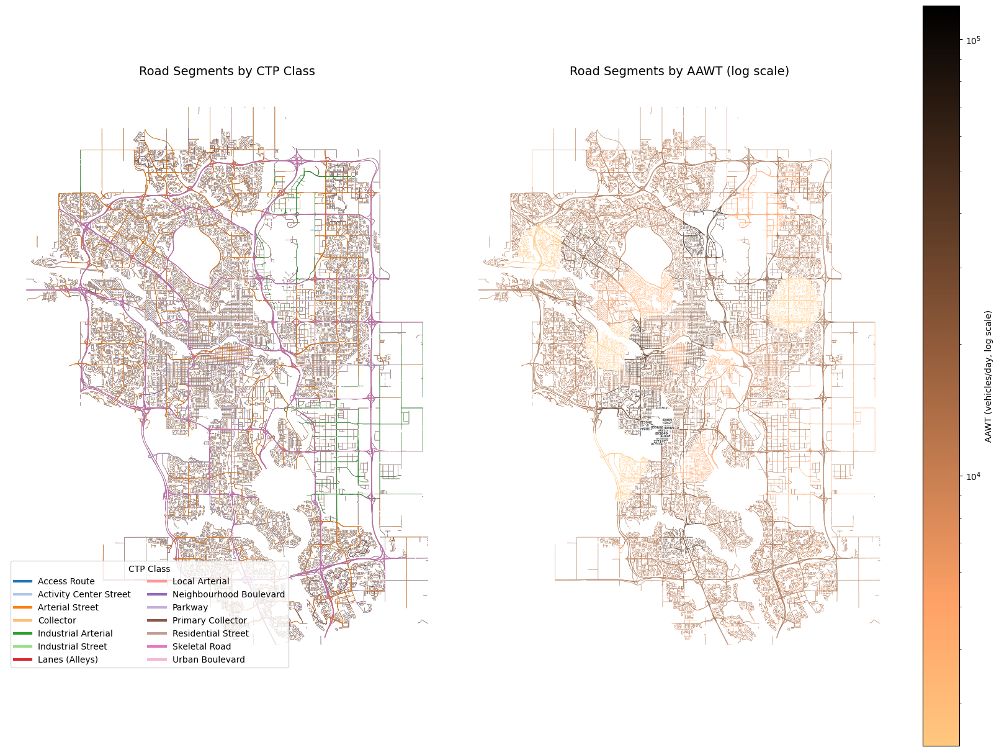

In [50]:
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
import seaborn as sns

gdf = road_segments_filtered.copy()

#  total AAWT and class
gdf["aawt_total"] = gdf[["aawt_weekday", "aawt_weekend"]].sum(axis=1, min_count=1)

classes = gdf["ctp_class"].dropna().unique()
classes = np.sort(classes)  # stable order
palette = sns.color_palette("tab20", n_colors=len(classes))
class_to_color = dict(zip(classes, palette))
gdf["class_color"] = gdf["ctp_class"].map(class_to_color)

# pick a small set to label (top N by AAWT)
N_LABEL = 15
lab = (gdf.dropna(subset=["aawt_weekday"])
          .sort_values("aawt_weekday", ascending=False)
          .head(N_LABEL))

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 12), constrained_layout=True)

# By road class (categorical colors)
ax = axes[0]
# light grey basemap of all segments (thin)
gdf.plot(ax=ax, color="black", linewidth=0.35)

# overlay per class to shoq legend colors
for cls, col in class_to_color.items():
    gdf[gdf["ctp_class"] == cls].plot(ax=ax, color=col, linewidth=0.4)

ax.set_title("Road Segments by CTP Class", fontsize=14)
ax.set_axis_off()

# Legend (categorical) with proxy lines
handles = [Line2D([0],[0], color=class_to_color[c], lw=3, label=str(c)) for c in classes]
ax.legend(handles=handles, title="CTP Class", loc="lower left", frameon=True, ncol=2)

# By AAWT (continuous log colormap)
ax2 = axes[1]
gdf.plot(
    ax=ax2,
    column="aawt_weekday",
    cmap="copper_r",
    linewidth=0.4,
    legend=True,
    norm=LogNorm(vmin=max(1, np.nanpercentile(gdf["aawt_total"], 5)),
                 vmax=np.nanpercentile(gdf["aawt_total"], 99.5)),
    legend_kwds={"label": "AAWT (vehicles/day, log scale)"}
)
ax2.set_title("Road Segments by AAWT (log scale)", fontsize=14)
ax2.set_axis_off()

# labels for top-N AAWT segments
for _, row in lab.iterrows():
    try:
        midx = row.geometry.interpolate(0.5, normalized=True).x
        midy = row.geometry.interpolate(0.5, normalized=True).y
        ax2.text(midx, midy, str(row["segment_id"]),
                 fontsize=4, ha="center", va="center",
                 bbox=dict(boxstyle="round,pad=0.15", fc="white", ec="none", alpha=0.6))
    except Exception:
        pass

plt.show()


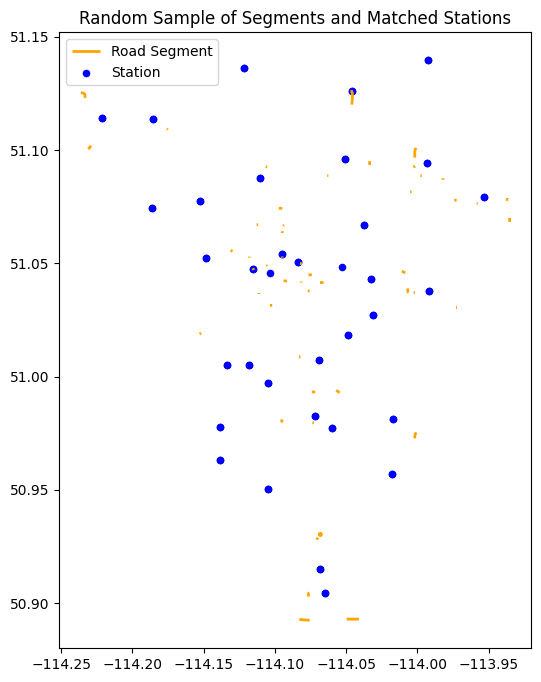

In [51]:
# Sample only segments with incidents & matched station distance
sample_ids = random.sample(
    list(road_segments_filtered.loc[
        (road_segments_filtered["incident_count"] > 0) &
        (road_segments_filtered["dist_to_station_m"].notna())
    ].index),
    min(50, road_segments_filtered.shape[0])
)

roads_sample = road_segments_filtered.loc[sample_ids]
stations_sample = stations_with_aawt.to_crs(road_segments_filtered.crs)

fig, ax = plt.subplots(figsize=(8, 8))
roads_sample.plot(ax=ax, color="orange", linewidth=2, label="Road Segment")
stations_sample.plot(ax=ax, color="blue", markersize=20, label="Station")
ax.legend()
ax.set_title("Random Sample of Segments and Matched Stations")
plt.show()

display()


,dist_to_station_m
count,20822.000000
mean,1173.489284
std,500.100474
min,0.140175
25%,789.643917
50%,1211.990334
75%,1591.070053
max,1999.828761


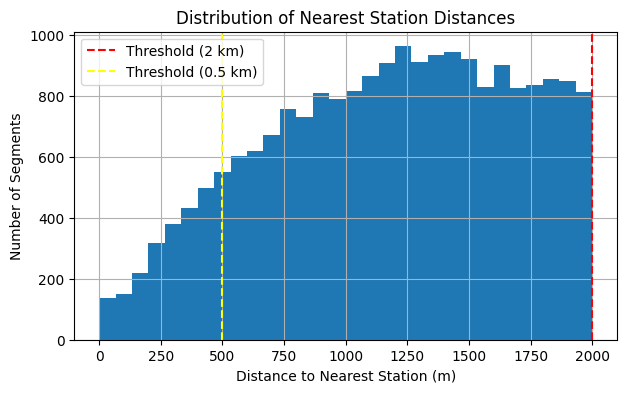

In [52]:
plt.figure(figsize=(7,4))
display(road_segments_filtered["dist_to_station_m"].dropna().describe())
road_segments_filtered["dist_to_station_m"].dropna().hist(bins=30)
plt.axvline(2000, color='red', linestyle='--', label='Threshold (2 km)')
plt.axvline(500, color='yellow', linestyle='--', label='Threshold (0.5 km)')

plt.xlabel("Distance to Nearest Station (m)")
plt.ylabel("Number of Segments")
plt.title("Distribution of Nearest Station Distances")
plt.legend()
plt.show()


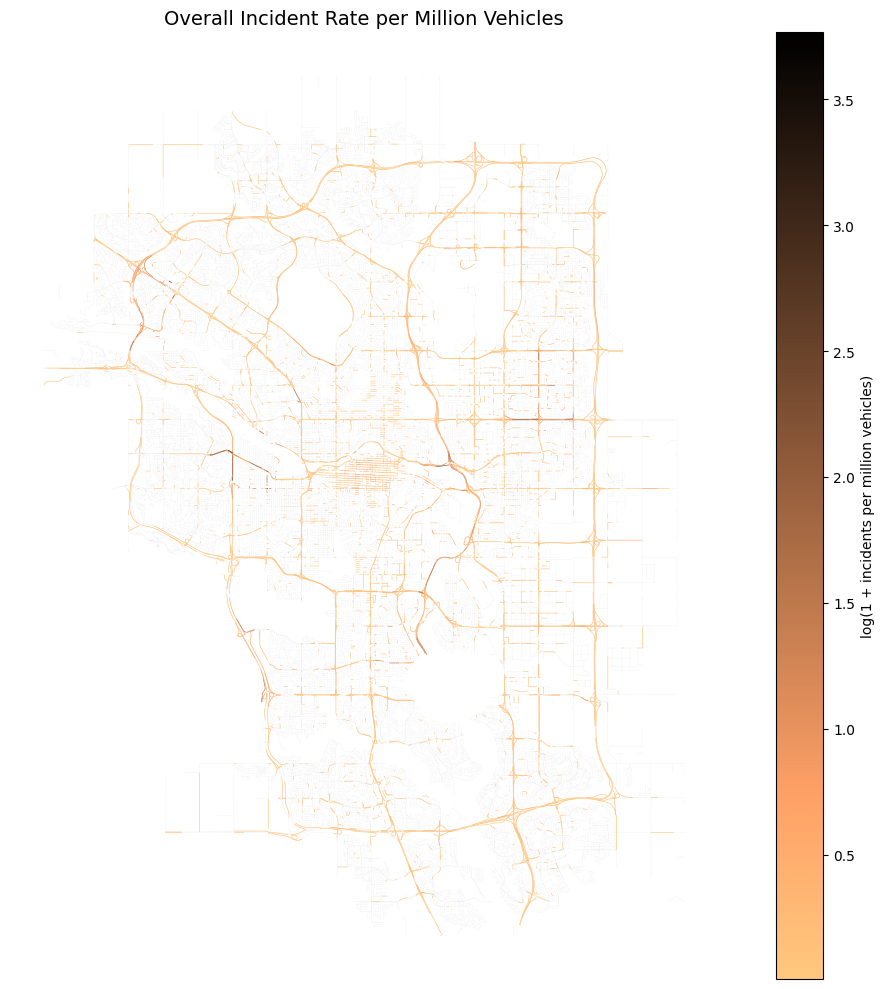

In [53]:
gdf = road_segments_filtered.copy()

# If rates are highly skewed log-transform for contrast
gdf["log_rate"] = np.log1p(gdf["rate_overall_per_million"].clip(lower=0))

fig, ax = plt.subplots(figsize=(12, 10))

# draw zero-rate segments faintly
zero_mask = gdf["rate_overall_per_million"].fillna(0) == 0
gdf.loc[zero_mask].plot(ax=ax, color="#ececec", linewidth=0.2, edgecolor="#cfcfcf")

# overlay nonzeros with a continuous colormap (log scale values)
gdf.loc[~zero_mask].plot(
    ax=ax,
    column="log_rate",
    cmap="copper_r",
    legend=True,
    linewidth=0.45,
    legend_kwds={"label": "log(1 + incidents per million vehicles)"}
)

ax.set_title("Overall Incident Rate per Million Vehicles", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()


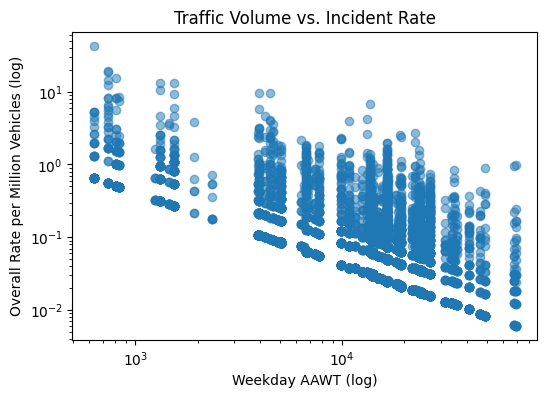

In [54]:
plt.figure(figsize=(6,4))
mask = (road_segments_filtered["aawt_weekday"] > 0) & (road_segments_filtered["rate_overall_per_million"] > 0)
plt.scatter(
    road_segments_filtered.loc[mask, "aawt_weekday"],
    road_segments_filtered.loc[mask, "rate_overall_per_million"],
    alpha=0.5
)
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Weekday AAWT (log)")
plt.ylabel("Overall Rate per Million Vehicles (log)")
plt.title("Traffic Volume vs. Incident Rate")
plt.show()


Road class distribution:


,ctp_class,n,pct
0,Residential Street,24389,0.538412
1,Collector,8554,0.188838
2,Arterial Street,5493,0.121264
3,Skeletal Road,3057,0.067486
4,Industrial Arterial,1027,0.022672
5,Primary Collector,983,0.021701
6,Urban Boulevard,851,0.018787
7,Parkway,419,0.009250
8,Neighbourhood Boulevard,309,0.006821
9,Industrial Street,89,0.001965


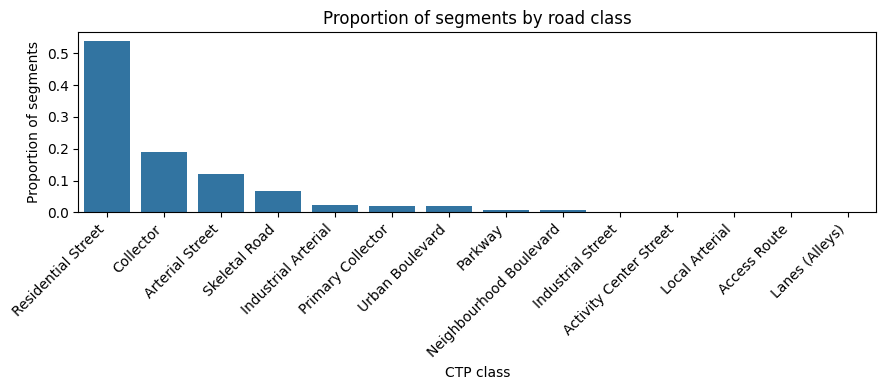

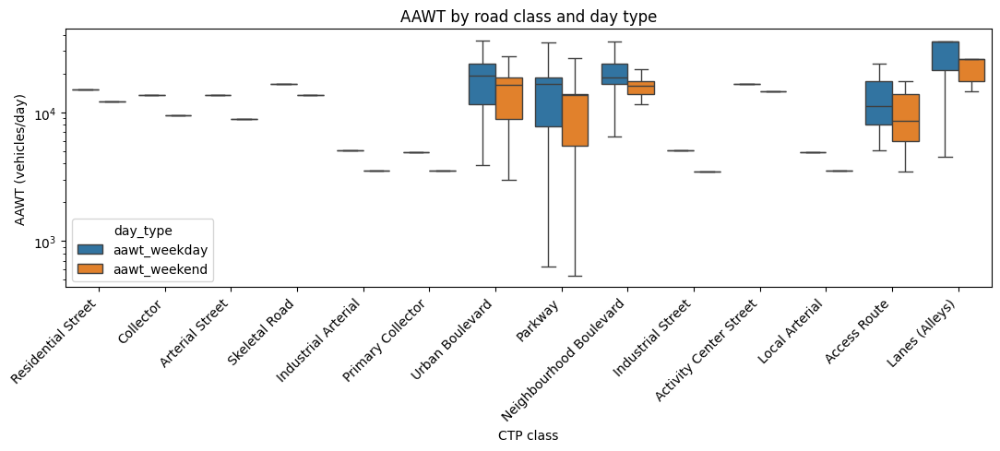

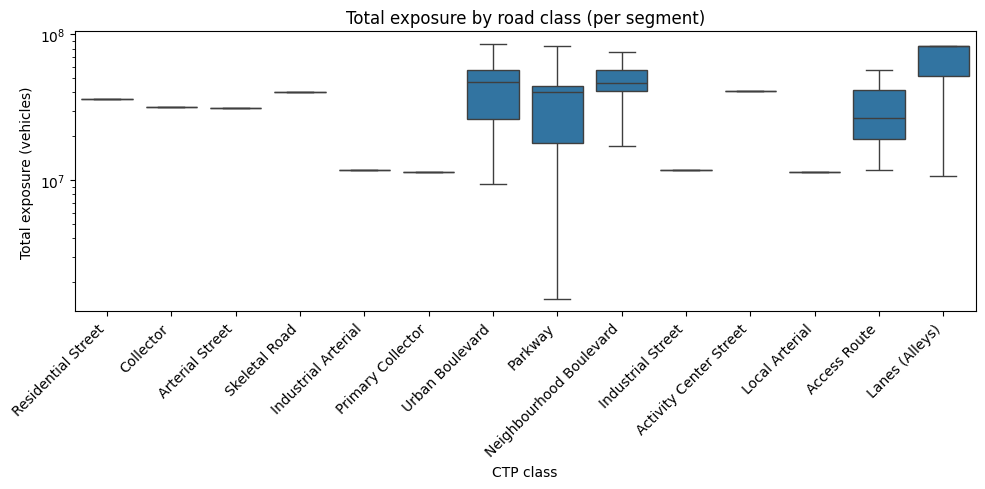

Summary stats by class:


,ctp_class,n,exposure_mean,exposure_median,rate_mean,rate_median
11,Residential Street,24389,3.766916e+07,3.627869e+07,0.002844,0.000000
3,Collector,8554,3.429860e+07,3.192825e+07,0.013429,0.000000
2,Arterial Street,5493,3.371084e+07,3.143380e+07,0.095996,0.000000
12,Skeletal Road,3057,4.288215e+07,4.030775e+07,0.198286,0.043336
4,Industrial Arterial,1027,1.894911e+07,1.179412e+07,0.044493,0.000000
10,Primary Collector,983,1.147499e+07,1.147254e+07,0.004609,0.000000
13,Urban Boulevard,851,4.382390e+07,4.703645e+07,0.069227,0.015463
9,Parkway,419,4.025874e+07,4.026050e+07,0.083926,0.000000
8,Neighbourhood Boulevard,309,4.606171e+07,4.615079e+07,0.209852,0.000000
5,Industrial Street,89,1.202598e+07,1.178410e+07,0.014703,0.000000


In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

df = road_segments_filtered.copy()
df["exposure_total"] = df[["exp_vehicle_days_weekday","exp_vehicle_days_weekend"]].sum(axis=1, min_count=1)


# Order classes by sample size
class_counts = df["ctp_class"].value_counts()
class_order = class_counts.index.tolist()

# Distributions / proportions of road classes
counts = (df["ctp_class"]
          .value_counts()
          .rename_axis("ctp_class").reset_index(name="n"))
counts["pct"] = counts["n"] / counts["n"].sum()

print("Road class distribution:")
display(counts)

# Bar plot of proportions
plt.figure(figsize=(9,4))
sns.barplot(data=counts, x="ctp_class", y="pct", order=class_order)
plt.ylabel("Proportion of segments")
plt.xlabel("CTP class")
plt.xticks(rotation=45, ha="right")
plt.title("Proportion of segments by road class")
plt.tight_layout()
plt.show()



# split weekday vs weekend as two boxes per class
aawt_long = df.melt(id_vars=["ctp_class"], value_vars=["aawt_weekday","aawt_weekend"],
                    var_name="day_type", value_name="aawt")
plt.figure(figsize=(11,5))
sns.boxplot(data=aawt_long, x="ctp_class", y="aawt", hue="day_type",
            order=class_order, showfliers=False)
plt.yscale("log")
plt.xlabel("CTP class")
plt.ylabel("AAWT (vehicles/day)")
plt.xticks(rotation=45, ha="right")
plt.title("AAWT by road class and day type")
plt.tight_layout()
plt.show()

# Exposure by road class
# Boxplot of per-segment total exposure (vehicles over the study window)
plt.figure(figsize=(10,5))
sns.boxplot(data=df, x="ctp_class", y="exposure_total", order=class_order, showfliers=False)
plt.yscale("log")
plt.xlabel("CTP class")
plt.ylabel("Total exposure (vehicles)")
plt.xticks(rotation=45, ha="right")
plt.title("Total exposure by road class (per segment)")
plt.tight_layout()
plt.show()



# Numeric summaries
summary = (df.groupby("ctp_class")
             .agg(
                 n=("segment_id","count"),
                 exposure_mean=("exposure_total","mean"),
                 exposure_median=("exposure_total","median"),
                 rate_mean=("rate_overall_per_million","mean"),
                 rate_median=("rate_overall_per_million","median"),
             )
             .reset_index()
          )
print("Summary stats by class:")
display(summary.sort_values("n", ascending=False))


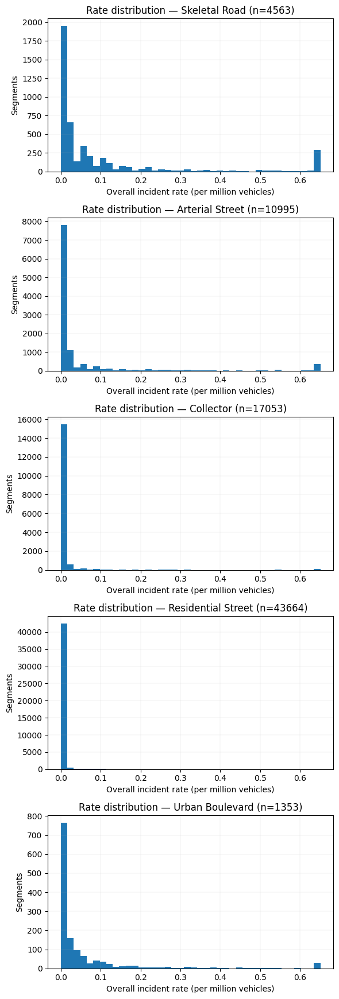

,count,mean,std,min,25%,50%,75%,max
ctp_class,,,,,,,,
Access Route,13.0,0.001358,0.004895,0.0,0.0,0.000000,0.000000,0.017649
Activity Center Street,135.0,0.001090,0.005893,0.0,0.0,0.000000,0.000000,0.049064
Arterial Street,10995.0,0.130548,1.643052,0.0,0.0,0.000000,0.031813,135.949906
Collector,17053.0,0.027457,0.453676,0.0,0.0,0.000000,0.000000,35.686850
Industrial Arterial,1805.0,0.073183,0.626009,0.0,0.0,0.000000,0.018046,23.791233
Industrial Street,146.0,0.023276,0.189012,0.0,0.0,0.000000,0.000000,2.004787
Lanes (Alleys),16.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
Local Arterial,102.0,0.022021,0.082374,0.0,0.0,0.000000,0.000000,0.679458
Neighbourhood Boulevard,546.0,0.151518,0.966721,0.0,0.0,0.000000,0.046390,19.345123


In [56]:

df = road_segments.copy()

# Trim extreme tail for readability
metric = "rate_overall_per_million"
clip_max = df[metric].quantile(0.99)  # 99th percentile cap
df_plot = df[(df[metric].notna()) & (df[metric] >= 0)]
df_plot = df_plot.assign(rate_clipped=np.minimum(df_plot[metric], clip_max))

classes = ["Skeletal Road", "Arterial Street", "Collector", "Residential Street", "Urban Boulevard"]

fig, axes = plt.subplots(nrows=len(classes), ncols=1, figsize=(6, 3.5*len(classes)))
if len(classes) == 1:
    axes = [axes]

for ax, c in zip(axes, classes):
    sub = df_plot[df_plot["ctp_class"] == c]
    if sub.empty:
        ax.set_title(f"{c} (no data)")
        continue
    ax.hist(sub["rate_clipped"], bins=40)
    ax.set_xlabel("Overall incident rate (per million vehicles)")
    ax.set_ylabel("Segments")
    ax.set_title(f"Rate distribution — {c} (n={len(sub)})")
    ax.grid(True, linewidth=0.3, alpha=0.4)

plt.tight_layout()
plt.show()

display(df_plot.groupby("ctp_class")[metric].describe())


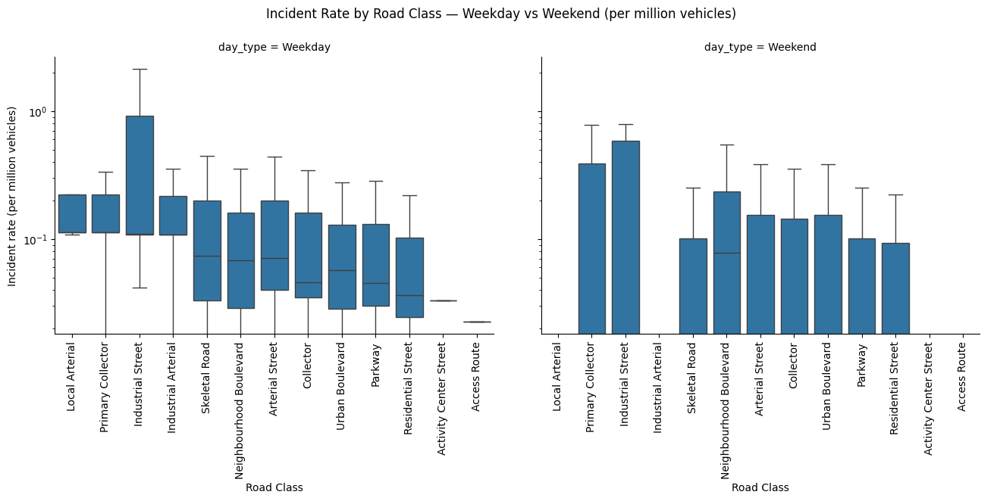

In [57]:
# Work on the filtered frame
df = road_segments.copy()

# Ensure the needed columns exist (skip rows with missing/zero exposure-derived rates)
rate_cols = ["rate_weekday_per_million", "rate_weekend_per_million"]
df = df.dropna(subset=rate_cols + ["ctp_class"])

# only  positive rates get plotted (keeps boxes visible on log scale)
df_pos = df[(df["rate_weekday_per_million"] > 0) | (df["rate_weekend_per_million"] > 0)].copy()

# Order classes by overall median rate so both facets use same ordering
if "rate_overall_per_million" in df_pos.columns:
    order = (
        df_pos.groupby("ctp_class")["rate_overall_per_million"]
        .median()
        .sort_values(ascending=False)
        .index.tolist()
    )
else:
    # Order by median weekday rate
    order = (
        df_pos.groupby("ctp_class")["rate_weekday_per_million"]
        .median()
        .sort_values(ascending=False)
        .index.tolist()
    )

# Melt to long format for faceting
long = df_pos.melt(
    id_vars=["ctp_class"],
    value_vars=["rate_weekday_per_million", "rate_weekend_per_million"],
    var_name="day_type",
    value_name="rate_per_million",
)

long["day_type"] = long["day_type"].map({
    "rate_weekday_per_million": "Weekday",
    "rate_weekend_per_million": "Weekend"
})


yvar = "rate_per_million"

# Build the facet boxplots
g = sns.catplot(
    data=long,
    x="ctp_class",
    y=yvar,
    col="day_type",
    kind="box",
    order=order,
    showfliers=False,
    height=5,
    aspect=1.3,
    sharey=True,
)

# Log y-axis
for ax in g.axes.flatten():
    ax.set_yscale("log")
    ax.set_xlabel("Road Class")
    ax.set_ylabel("Incident rate (per million vehicles)")
    ax.tick_params(axis="x", rotation=90)

g.fig.subplots_adjust(top=0.85)
g.fig.suptitle("Incident Rate by Road Class — Weekday vs Weekend (per million vehicles)")

plt.show()


##### Modelling

##### Preliminary model building + evaluation

For our initial modeling testing/experiments we cross validated a logistic regression model and a random forest regressor using the whole segments dataset which spatially spans the whole of Calgary, and then made predictions for a subset of the map specifically the downtown area containing 1636 segments. A Kernel Density Estimation model was also fit on the traffic incidents spacial data, subseted to the downtown calgary coordinates to produce a density map of incident risk. Since using regression modeling produced the weakest results, we chose to model the problem as a classification problem. We then compared the model outputs graphically(plot of logits vs kde density map plot)


Both models show some agreement in core hotspots. The central high-density area in the KDE (south of the river) also has high predicted probabilities which suggests the model successfully learned that these street characteristics correlate with risk.

The logistic model, however, highlights segments KDE doesn’t. The prediction map assigns high probabilities to some corridors east and west of the main hotspot, where KDE shows weaker density.

This likely means the model is factoring in high exposure (eg major road classification or high weekday/weekend traffic) even if recent incident counts are sparse.

The KDE model also shows noise the logistic model ignores. The KDE msp has small bright pockets from isolated clusters of incidents however, the logistic model often ignores these if they don’t match a general high-risk profile, which could be a sign it’s generalizing better.

In [62]:
from shapely.geometry import box
from sklearn.neighbors import KernelDensity
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Downtown-ish box
subset_bbox_4326 = box(-114.10, 51.035, -114.04, 51.065)

# 2) Subset incidents & segments to that box
incidents_sub = incidents_gdf[incidents_gdf.to_crs(4326).intersects(subset_bbox_4326)].copy()
segments_sub  = road_segments_filtered[road_segments_filtered.to_crs(4326).intersects(subset_bbox_4326)].copy()

# Keep only incidents in  analysis window
start = pd.Timestamp("2018-01-01")
end   = pd.Timestamp("2024-12-31")
incidents_sub["start_dt"] = pd.to_datetime(incidents_sub["start_dt"], errors="coerce")
incidents_sub = incidents_sub[(incidents_sub["start_dt"] >= start) & (incidents_sub["start_dt"] <= end)].copy()

print(len(incidents_sub), "incidents in subset")
print(len(segments_sub),  "segments in subset")

# Project subset to meters for KDE & sampling (UTM 11N)
inc_m  = incidents_sub.to_crs(32611)
segs_m = segments_sub.to_crs(32611)


4120 incidents in subset
1636 segments in subset


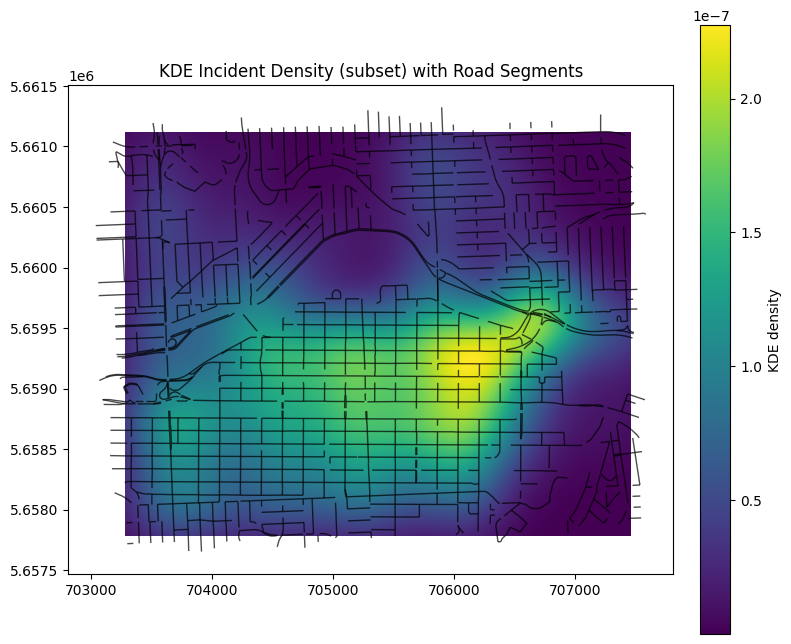

In [63]:
# Fit KDE on incident point coordinates
coords = np.vstack([inc_m.geometry.x, inc_m.geometry.y]).T
if len(coords) < 5:
    print("Very few incidents in this subset; KDE may look sparse.")
bandwidth = 250  # meters; try 150–400 to taste
kde = KernelDensity(bandwidth=bandwidth, kernel='gaussian')
if len(coords) > 0:
    kde.fit(coords)

# Make a grid over the subset extent and evaluate density
minx, miny, maxx, maxy = inc_m.total_bounds if len(inc_m) else segs_m.total_bounds
nx, ny = 200, 200  # grid resolution
xx, yy = np.meshgrid(np.linspace(minx, maxx, nx), np.linspace(miny, maxy, ny))
grid_xy = np.vstack([xx.ravel(), yy.ravel()]).T

dens = np.zeros(xx.size)
if len(coords) > 0:
    log_dens = kde.score_samples(grid_xy)
    dens = np.exp(log_dens)

dens_img = dens.reshape(xx.shape)

# Plot KDE heatmap witth segments overlay in meters CRS
fig, ax = plt.subplots(figsize=(8, 7))
if len(coords) > 0:
    im = ax.imshow(dens_img, origin="lower",
                   extent=(minx, maxx, miny, maxy))
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("KDE density")
segs_m.plot(ax=ax, linewidth=1, color="black", alpha=0.7)
ax.set_title("KDE Incident Density (subset) with Road Segments")
plt.tight_layout()
plt.show()


In [64]:
from sklearn.model_selection import GroupKFold, cross_validate, cross_val_predict
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (r2_score, f1_score, mean_absolute_error, precision_score, recall_score,
                             accuracy_score, roc_auc_score, average_precision_score,
                             confusion_matrix, classification_report)


dfm = road_segments_filtered.copy()

# Features
model_cols = [
    "aawt_weekday","aawt_weekend","p_public_holiday",
    "p_peak_hours","is_major_road",
]
target_reg = "rate_overall_per_million"

# 2 km grid cells for spatial grouping (avoid leakage)
dfm_m = dfm.to_crs(32611)
dfm["x_m"] = dfm_m.geometry.centroid.x
dfm["y_m"] = dfm_m.geometry.centroid.y
cell = 2000.0
dfm["grid_id"] = (dfm["x_m"] // cell).astype(int).astype(str) + "_" + (dfm["y_m"] // cell).astype(int).astype(str)

# Keep rows with target
dfm = dfm[dfm[target_reg].notna()].copy()

# Random Forest
X_reg = dfm[model_cols]
y_reg = dfm[target_reg].values
groups = dfm["grid_id"]

rf_pipe = Pipeline([
    ("imp", SimpleImputer(strategy="median")),
    ("rf", RandomForestRegressor(
        n_estimators=400, min_samples_leaf=3,
        random_state=42, n_jobs=-1
    ))
])

gkf = GroupKFold(n_splits=5)
reg_scores = cross_validate(
    rf_pipe, X_reg, y_reg, cv=gkf, groups=groups,
    scoring={"r2":"r2","neg_mae":"neg_mean_absolute_error"}
)
print("Spatial CV — RF Regression")
print("R2 (mean±std):  ", f"{reg_scores['test_r2'].mean():.3f} ± {reg_scores['test_r2'].std():.3f}")
print("MAE (mean±std): ", f"{(-reg_scores['test_neg_mae']).mean():.4f} ± {(-reg_scores['test_neg_mae']).std():.4f}")

# Logistic Regression
top_pct = 0.10
cut = dfm[target_reg].quantile(1 - top_pct)
dfm["high_risk"] = (dfm[target_reg] >= cut).astype(int)

X_cls = dfm[model_cols]
y_cls = dfm["high_risk"].astype(int)

logit_pipe = Pipeline([
    ("imp", SimpleImputer(strategy="median")),
    ("sc", StandardScaler()),
    ("clf", LogisticRegression(
        penalty="l2", C=1.0, class_weight="balanced",
        solver="lbfgs", max_iter=2000
    ))
])

# Cross-validated metrics (spatially disjoint)
cls_scores = cross_validate(
    logit_pipe, X_cls, y_cls, cv=gkf, groups=groups,
    scoring={"f1":"f1","precision":"precision","recall":"recall",
             "accuracy":"accuracy","roc_auc":"roc_auc",
             "pr_auc":"average_precision"}
)
print("\nSpatial CV — Logistic (balanced, scaled)")
for k in ["f1","precision","recall","accuracy","roc_auc","pr_auc"]:
    print(f"{k.upper():8s}: {cls_scores[f'test_{k}'].mean():.3f} ± {cls_scores[f'test_{k}'].std():.3f}")

# Out-of-fold probabilities for mapping
oof_prob = cross_val_predict(
    logit_pipe, X_cls, y_cls, cv=gkf, groups=groups, method="predict_proba"
)[:,1]
dfm["oof_prob_logit"] = oof_prob


Spatial CV — RF Regression
R2 (mean±std):   -0.010 ± 0.087
MAE (mean±std):  0.0458 ± 0.0116

Spatial CV — Logistic (balanced, scaled)
F1      : 0.499 ± 0.024
PRECISION: 0.363 ± 0.026
RECALL  : 0.802 ± 0.047
ACCURACY: 0.829 ± 0.014
ROC_AUC : 0.840 ± 0.024
PR_AUC  : 0.358 ± 0.041


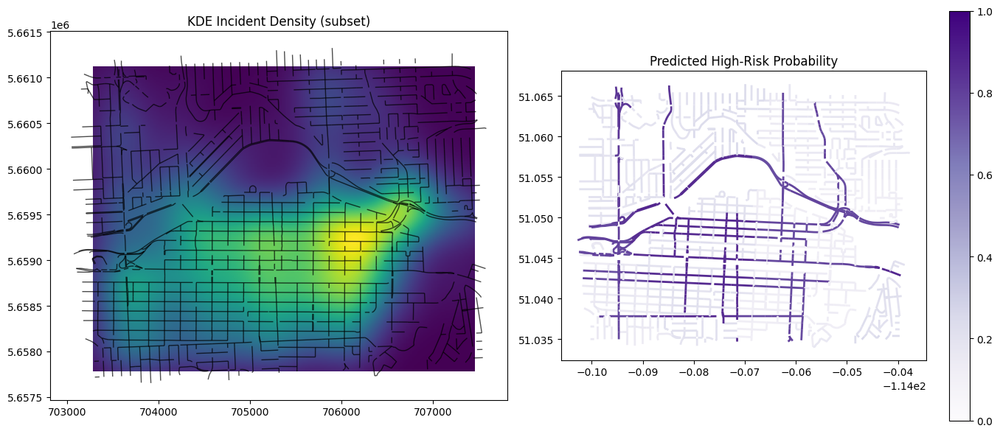

In [65]:
# Attach Out Of Fold probabilities from dfm to the subset segments
seg_with_oof = segments_sub.merge(
    dfm[["segment_id","oof_prob_logit"]],
    on="segment_id", how="left"
)

# Plot KDE density (left) vs OOF predicted risk (right)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# KDE heatmap from earlier variables
axes[0].imshow(dens_img, origin="lower", extent=(minx, maxx, miny, maxy))
segs_m.plot(ax=axes[0], linewidth=1, color="black", alpha=0.7)
axes[0].set_title("KDE Incident Density (subset)")

# Predicted risk (OOF logistic probs) on segments
seg_with_oof.plot(
    ax=axes[1], column="oof_prob_logit",
    cmap="Purples", linewidth=2, legend=True, vmin=0, vmax=1
)
axes[1].set_title("Predicted High-Risk Probability")

plt.tight_layout()
plt.show()


##### Main Model Training and Evaluation

For our approach to the main modeling task, we tuned some classification models to the data using spatial Cross Validation and then made predictions on segments spanning the entire city of calgary. We also fit a KDE model to our traffic incidents data passing the KDE model the coordinates where incidents occured and then generate a density map for the entire city's road network. We did not tune the  KDE model's parameters

Our model training and evaluation pipeline was as follows:
* Train and tune Logistic, Random Forest classifier, and a GradientBoosting model as our supervised models.

* We compare the best classifier's predictions to a Kernel Density Estimator risk density map.

* Produce full-city predictions and zoomed-in subset maps(downtown, industrial zones, high-incident corridors, etc) and manually inspect model results.

For cross validation, we partition the city into spatial blocks (2 km grid cells) and treat each block as a fold unit. For fold i, we hold out all segments whose centroid falls within the fold’s block/bounds for testing, and train on the rest.

Because traffic safety patterns are likely to be spatially autocorrelated(nearby segments tend to have similar risk). A random split could give the model very similar roads in both train and test splits, making it look like it generalizes better than it actually does.

What we dd instead was to partition the space, making each fold a set of spatial blocks (2 km × 2 km squares). We then train on all but one fold and test on the held-out fold.
This way, the model is tested on unseen geographical data. During our spatial CV, we use each fold’s test set for validation for tuning as well.


###### Results
Across different sets of predictors, the RandomForest classifier had the higest cv score(0.537) and so was chosen as the best estimator. The final set of predictors used were:
`"ctp_class","one_way","octant"    "aawt_weekday","aawt_weekend", "is_major_road" "x_m","y_m", "p_peak_hours"`

We chose this set of predictors because we beleive they represent a good blend of highly relevant spatial, categorical, volume and temporal variables


### **Comparing Random Forest Predictions to KDE Density Estimates**

In the RF maps, some arterial and connector roads between hot spots still receive moderate-to-high probability scores despite not being at the absolute centers of past incident clusters.

The Kernel Density Estimation (KDE) maps are spatial and unsupervised, showing the smoothed spatial distribution of past incident points. KDE highlights only where incidents have typically occurred, with intensity decaying smoothly away from the event locations. It does not consider road attributes or other predictors, meaning that high-density areas always correspond to historical hot spots, but it may underrepresent emerging risk areas when past data is limited.

Looking at the zoomed-in areas:
* Downtown/Beltline: Both models identify the dense grid network as high-risk, but KDE shows a very localized core around the heaviest clusters, while Random Forest spreads risk to nearby streets with similar patterns of connectivity and volume.

* Deerfoot (Anderson–Memorial): KDE strongly isolates the interchange ramps and crossing points where incidents have historically clustered. Radnom Forest, however, assigns elevated probabilities along larger stretches of Deerfoot Trail, suggesting that it infers risk from the road type even beyond the exact historical hot spots.

* Crowchild/Shaganappi: The KDE map captures high densities at major intersections and merges, while the Random Forest model expands elevated risk along the corridors feeding into them, reflecting the influence of road classification and traffic patterns.

Overall:

* KDE seemed to be better for descriptive hotspot mapping
* Random Forest is better for predictive risk scoring
* Using them together can help differentiate between current, historically proven high-risk zones (KDE) and potentially emerging high-risk zones (Random Forest).



###### Spatial *CV*

In [40]:
from sklearn.model_selection import BaseCrossValidator

class SpatialBlockCV(BaseCrossValidator):
    def __init__(self, gdf, n_splits=5, block_size=2000, random_state=42):
        self.n_splits = n_splits
        self.block_size = block_size
        self.random_state = random_state

        # Keep a projected copy to make blocks; keep original index for alignment
        gdf_proj = gdf.to_crs(32611).copy()
        cent = gdf_proj.geometry.centroid
        gx = (cent.x // block_size).astype(int)
        gy = (cent.y // block_size).astype(int)
        gdf_proj["block_id"] = gx.astype(str) + "_" + gy.astype(str)

        self._index = gdf.index.to_numpy()
        self._blocks_by_row = pd.Series(gdf_proj["block_id"].values, index=self._index)
        self.blocks = self._blocks_by_row.unique()

    def get_n_splits(self, X=None, y=None, groups=None):
        return self.n_splits

    def split(self, X, y=None, groups=None):
        # Map the current X's index to our stored blocks, then make folds
        x_index = pd.Index(X.index)
        blocks_series = self._blocks_by_row.reindex(x_index, copy=False)
        rng = np.random.default_rng(self.random_state)
        shuffled = blocks_series.drop_duplicates().dropna().values.copy()
        rng.shuffle(shuffled)
        folds = np.array_split(shuffled, self.n_splits)

        for fold_blocks in folds:
            test_mask = blocks_series.isin(set(fold_blocks))
            test_idx = np.flatnonzero(test_mask.values)
            train_idx = np.flatnonzero(~test_mask.values)
            yield train_idx, test_idx



###### Model tuning

In [58]:
from sklearn.model_selection import BaseCrossValidator, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier



gdf_base = road_segments_filtered.copy()


if not {"x_m","y_m"}.issubset(gdf_base.columns):
    _m = gdf_base.to_crs(32611)
    _cent = _m.geometry.centroid
    gdf_base["x_m"] = _cent.x
    gdf_base["y_m"] = _cent.y


num_cols = [
   "aawt_weekday","aawt_weekend", "is_major_road", "x_m","y_m", "p_peak_hours"
]

cat_cols = ["ctp_class","one_way","octant"]

num_cols = [c for c in num_cols if c in gdf_base.columns]
cat_cols = [c for c in cat_cols if c in gdf_base.columns]

print("Numeric cols (used):", len(num_cols))
print("Categorical cols (used):", cat_cols)

# Target label
if "high_risk" in gdf_base.columns:
    y = gdf_base["high_risk"].astype(int)
else:
    thr = np.nanpercentile(gdf_base["rate_overall_per_million"], 90)
    y = (gdf_base["rate_overall_per_million"] >= thr).astype(int)


Numeric cols (used): 6
Categorical cols (used): ['ctp_class', 'one_way', 'octant']


In [59]:
# Preprocessing
numeric_pipe = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("scale", StandardScaler()),  # helps LR
])

categorical_pipe = Pipeline([
    ("impute", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore")),
])

preprocess = ColumnTransformer(
    transformers=[
        ("num", numeric_pipe, num_cols),
        ("cat", categorical_pipe, cat_cols),
    ],
    remainder="drop",
    verbose_feature_names_out=False,
)

# Pipelines
pipe_logit = Pipeline([
    ("prep", preprocess),
    ("clf", LogisticRegression(max_iter=3000, class_weight="balanced")),
])

pipe_rf = Pipeline([
    ("prep", preprocess),
    ("clf", RandomForestClassifier(random_state=42, n_jobs=-1, class_weight="balanced")),
])

pipe_gb = Pipeline([
    ("prep", preprocess),
    ("clf", GradientBoostingClassifier(random_state=42)),  # uses deviance loss → has predict_proba
])

# Param grids
logit_params = {
    "clf__C": [0.05, 0.1, 0.5, 1, 2, 5],
    "clf__penalty": ["l2"],
    "clf__solver": ["lbfgs"],
    "clf__class_weight": ["balanced", None],
}

rf_params = {
    "clf__n_estimators": [200, 400],
    "clf__max_depth": [10, 20, None],
    "clf__min_samples_leaf": [1, 2],
}

gb_params = {
    "clf__n_estimators": [200, 400],
    "clf__learning_rate": [0.05, 0.1],
    "clf__max_depth": [3, 5]
}

# Spatial CV and GridSearch
X = gdf_base  # pass the whole frame; ColumnTransformer selects by name
spatial_cv = SpatialBlockCV(gdf_base, n_splits=5, block_size=2000, random_state=42)
scoring = "f1"  #

grid_logit = GridSearchCV(
    pipe_logit, logit_params, cv=spatial_cv, scoring=scoring,
    n_jobs=-1, refit=True, error_score="raise"
)
grid_rf = GridSearchCV(
    pipe_rf, rf_params, cv=spatial_cv, scoring=scoring,
    n_jobs=-1, refit=True, error_score="raise"
)
grid_gb = GridSearchCV(
    pipe_gb, gb_params, cv=spatial_cv, scoring=scoring,
    n_jobs=-1, refit=True, error_score="raise"
)



In [60]:
print("Fitting LogisticRegression…")
grid_logit.fit(X, y)
print("Best LR:", grid_logit.best_params_, "CV:", round(grid_logit.best_score_, 3))

print("Fitting RandomForest…")
grid_rf.fit(X, y)
print("Best RF:", grid_rf.best_params_, "CV:", round(grid_rf.best_score_, 3))

print("Fitting GradientBoosting…")
grid_gb.fit(X, y)
print("Best GB:", grid_gb.best_params_, "CV:", round(grid_gb.best_score_, 3))



Fitting LogisticRegression…
Best LR: {'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__penalty': 'l2', 'clf__solver': 'lbfgs'} CV: 0.497
Fitting RandomForest…


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best RF: {'clf__max_depth': 20, 'clf__min_samples_leaf': 2, 'clf__n_estimators': 200} CV: 0.537
Fitting GradientBoosting…
Best GB: {'clf__learning_rate': 0.1, 'clf__max_depth': 5, 'clf__n_estimators': 400} CV: 0.445


###### Model Predictions

In [66]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, Normalize
from matplotlib.cm import ScalarMappable
from sklearn.neighbors import KernelDensity
from shapely.geometry import Point

# RF predictions
X = gdf_base[num_cols + cat_cols]
best_rf = grid_rf.best_estimator_
road_segments_filtered["rf_pred"] = best_rf.predict_proba(X)[:, 1]



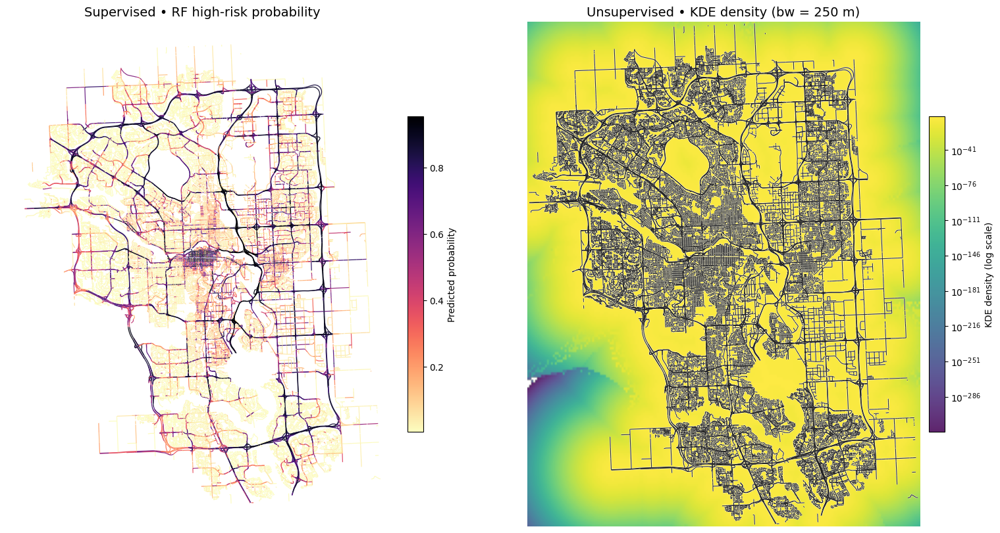

In [100]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.cm import ScalarMappable
from matplotlib import cm, colors
from sklearn.neighbors import KernelDensity

segments_sub  = road_segments_filtered.copy()        # all segments
incidents_sub = incidents_gdf.copy()                 # all incidents

start = pd.Timestamp("2018-01-01")
end   = pd.Timestamp("2024-12-31")
incidents_sub["start_dt"] = pd.to_datetime(incidents_sub["start_dt"], errors="coerce")
incidents_sub = incidents_sub[(incidents_sub["start_dt"] >= start) & (incidents_sub["start_dt"] <= end)]


#  Project to meters for clean visuals / KDE
segs_m = segments_sub.to_crs(32611)
inc_m  = incidents_sub.to_crs(32611)

# KDE on incident coordinates
coords = np.vstack([inc_m.geometry.x, inc_m.geometry.y]).T
bw = 250  # meters

kde = KernelDensity(bandwidth=bw, kernel="gaussian")
if len(coords) > 0:
    kde.fit(coords)

# Grid over subset extent (pad a bit so edges aren’t harsh)
xmin, ymin, xmax, ymax = (segs_m.total_bounds if len(segs_m) else inc_m.total_bounds)
pad = 150
xmin, xmax = xmin - pad, xmax + pad
ymin, ymax = ymin - pad, ymax + pad

nx, ny = 200, 200
xx, yy = np.meshgrid(np.linspace(xmin, xmax, nx), np.linspace(ymin, ymax, ny))
grid_xy = np.vstack([xx.ravel(), yy.ravel()]).T

dens = np.zeros(xx.size)
if len(coords) > 0:
    dens = np.exp(kde.score_samples(grid_xy))
dens_img = dens.reshape(xx.shape)

# Figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)

# Left: RF predicted probability on segments
segs_m.plot(ax=ax1, color="white", linewidth=1.8, alpha=0.9, zorder=2)

# contrast-aware normalization (clip tails to 1–99th percentile)
vmin = np.nanpercentile(segments_sub["rf_pred"], 1)
vmax = np.nanpercentile(segments_sub["rf_pred"], 99)
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = cm.magma_r

segs_m.plot(
    ax=ax1, column="rf_pred", cmap=cmap, linewidth=0.9, alpha=0.95,
    zorder=3, legend=False
)

# add a proper colorbar
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar1 = fig.colorbar(sm, ax=ax1, fraction=0.035, pad=0.02)
cbar1.set_label("Predicted probability")

ax1.set_title("Supervised • RF high-risk probability", fontsize=14)
ax1.set_aspect("equal")
ax1.set_axis_off()

# Right: KDE heatmap + road overlay (same visual recipe you liked)
if len(coords) > 0:
    im = ax2.imshow(
        dens_img, origin="lower",
        extent=(xmin, xmax, ymin, ymax),
        cmap="viridis", norm=LogNorm(), alpha=0.86
    )
    cbar2 = plt.colorbar(im, ax=ax2, fraction=0.035, pad=0.02)
    cbar2.set_label("KDE density (log scale)")

    # subtle contours (7 log-spaced levels)
    # vpos = dens_img[dens_img > 0]
    # if vpos.size:
    #     levels = np.geomspace(max(vpos.min(), dens_img.max()*1e-6), dens_img.max(), 7)
    #     ax2.contour(xx, yy, dens_img, levels=levels, colors="k", linewidths=0.4, alpha=0.35)

# street overlay for context
segs_m.plot(ax=ax2, color="white", linewidth=1.6, alpha=0.85, zorder=3)
segs_m.plot(ax=ax2, color="#222222", linewidth=0.8, alpha=0.95, zorder=4)

ax2.set_title(f"Unsupervised • KDE density (bw = {bw} m)", fontsize=14)
ax2.set_aspect("equal")
ax2.set_axis_off()

plt.show()


AttributeError: 'NoneType' object has no attribute 'centroid'

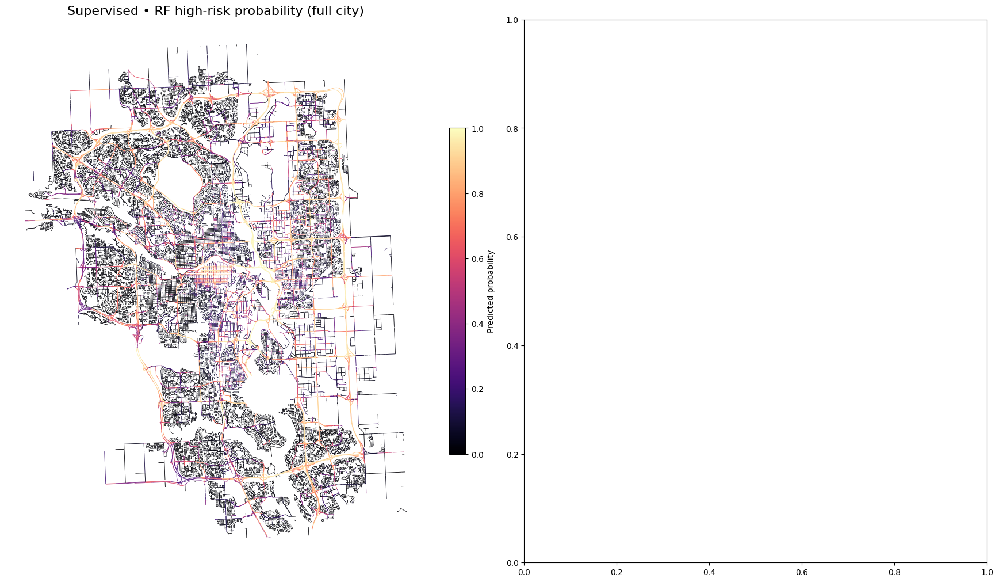

In [101]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm
from sklearn.neighbors import KernelDensity
from matplotlib.cm import ScalarMappable
from matplotlib import cm, colors

# 1) Load official community boundaries (City of Calgary Open Data)
# Using the “Community Boundaries” dataset
# Source: Community Boundaries for the City of Calgary (updated July 2025) :contentReference[oaicite:6]{index=6}
comm = gpd.read_file("https://data.calgary.ca/resource/ab7m-fwn6.geojson")
comm = comm.to_crs(epsg=32611)  # UTM meters

# 2) Prepare your RF predictions (already in road_segments_filtered)
if "rf_pred" not in road_segments_filtered:
    # compute as earlier
    ...

# 3) Project segments & incidents to meters CRS
segs_m = road_segments_filtered.to_crs(epsg=32611)
inc_m = incidents_gdf.to_crs(epsg=32611)

# 4) Build KDE grid for the full city
coords = np.vstack([inc_m.geometry.x, inc_m.geometry.y]).T
bw = 250  # meters
kde = KernelDensity(bandwidth=bw, kernel="gaussian")
kde.fit(coords)

xmin, ymin, xmax, ymax = segs_m.total_bounds
pad = 1500  # generous padding for full-city heatmap
xmin, xmax = xmin - pad, xmax + pad
ymin, ymax = ymin - pad, ymax + pad

nx, ny = 350, 350
xx, yy = np.meshgrid(np.linspace(xmin, xmax, nx), np.linspace(ymin, ymax, ny))
grid_xy = np.vstack([xx.ravel(), yy.ravel()]).T
dens_img = np.exp(kde.score_samples(grid_xy)).reshape(xx.shape)

# 5) Plot side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10), constrained_layout=True)

# Left: RF map
vmin, vmax = 0.0, 1.0
segs_m.plot(ax=ax1, column="rf_pred", cmap="magma", linewidth=0.6,
            vmin=vmin, vmax=vmax, legend=True,
            legend_kwds={"shrink": 0.6, "label": "Predicted probability"})
ax1.set_title("Supervised • RF high-risk probability (full city)", fontsize=16)
ax1.set_axis_off()

# Overlay community names (optional on both panels for comparison)
for idx, row in comm.iterrows():
    c = row.geometry.centroid
    ax1.text(c.x, c.y, row['community'], fontsize=8, color="black",
             ha="center", va="center", alpha=0.7)

# Right: KDE map
im = ax2.imshow(dens_img, origin="lower",
                extent=(xmin, xmax, ymin, ymax),
                cmap="viridis", norm=LogNorm(), alpha=0.85)
cbar2 = plt.colorbar(im, ax=ax2, fraction=0.035, pad=0.02)
cbar2.set_label("KDE density (log scale)", fontsize=12)
ax2.contour(xx, yy, dens_img, levels=10, colors="k", linewidths=0.3, alpha=0.4)

# Overlay segments
segs_m.boundary.plot(ax=ax2, color="black", linewidth=0.2, alpha=0.4)

# Overlay community names similarly
for idx, row in comm.iterrows():
    c = row.geometry.centroid
    ax2.text(c.x, c.y, row['community'], fontsize=8, color="white",
             ha="center", va="center", alpha=0.7)

ax2.set_title(f"Unsupervised • KDE density (bw = {bw} m)", fontsize=16)
ax2.set_axis_off()

plt.show()


In [ ]:
# bboxes = [
#   # Downtown
#   (-114.10, 51.03, -114.03, 51.08),
#   # South-Central Corridor (toward Macleod/Elbow south of core)
#   (-114.09, 50.96, -113.99, 51.05),
#   # NE Industrial / Commercial (around 32 Ave NE / 36 St NE area)
#   (-113.99, 51.05, -113.93, 51.10)
#   # West-Central Interchanges (Crowchild / Bow Trail / Sarcee area)
#   (-114.17, 51.03, -114.11, 51.08)
#   # East Ring-Road Interchanges (SE quadrant, 17 Ave SE / Peigan / Stoney area
#   # (-113.98, 50.96, -113.90, 51.03),
#   # NW Ring-Road / Crowchild–Stoney interface
#   # (-114.25, 51.09, -114.14, 51.17),
#   # South Ring-Road Interchanges (SW/SE edge)
#   # (-114.10, 50.88, -113.95, 50.95)
#   ]

# for bbox in bboxes:
#   # pick one AOI
#   minx, miny, maxx, maxy =  bbox

#   # subset segments
#   aoi = road_segments_filtered.cx[minx:maxx, miny:maxy].copy()

#   # LEFT: supervised risk
#   fig, (axL, axR) = plt.subplots(1, 2, figsize=(16, 9))
#   aoi.plot(ax=axL, column="rf_pred", cmap="plasma", linewidth=0.6,
#           legend=True, legend_kwds={"label": "RF predicted high-risk prob"})
#   axL.set_title("RF risk — AOI"); axL.set_xlim([minx, maxx]); axL.set_ylim([miny, maxy]); axL.set_axis_off()

#   # RIGHT: KDE
#   roads_m = road_segments_filtered.to_crs(32611)
#   aoi_m   = aoi.to_crs(32611)
#   bxmin, bymin, bxmax, bymax = aoi_m.total_bounds

#   axR.imshow(Z, origin="lower", extent=[xmin, xmax, ymin, ymax], cmap="viridis", alpha=0.9)
#   roads_m.boundary.plot(ax=axR, color="black", lw=0.2, alpha=0.35)
#   axR.set_xlim([bxmin, bxmax]); axR.set_ylim([bymin, bymax])
#   axR.set_title("KDE density — AOI"); axR.set_axis_off()
#   plt.tight_layout(); plt.show()

Incidents in window: 28760


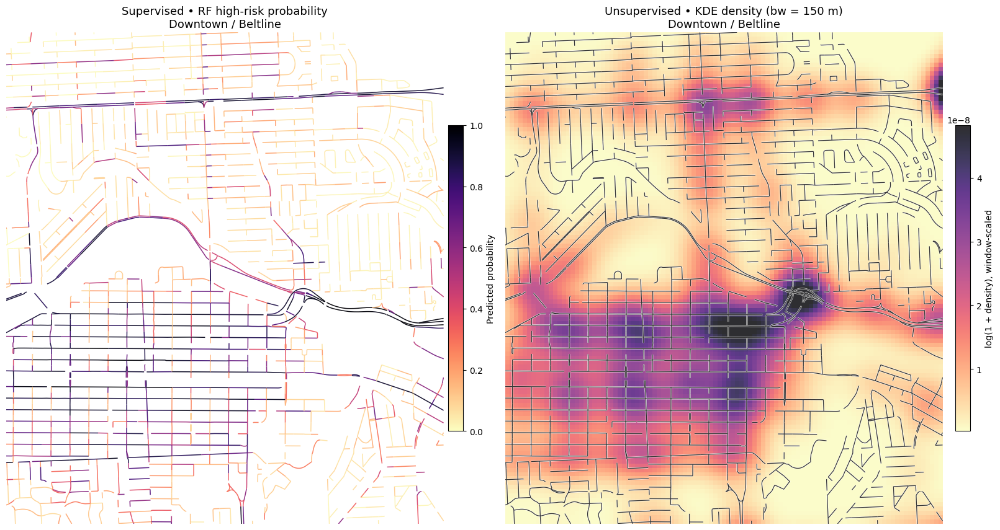

Incidents in window: 4424


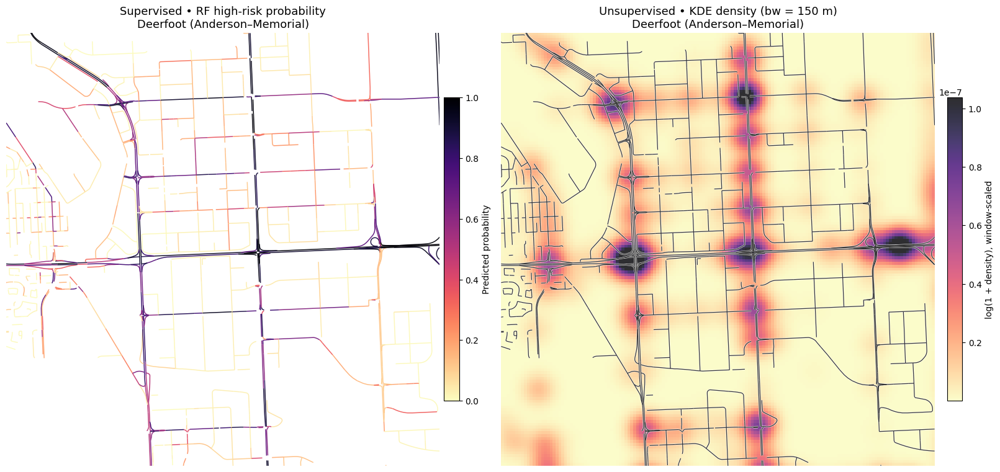

Incidents in window: 40671


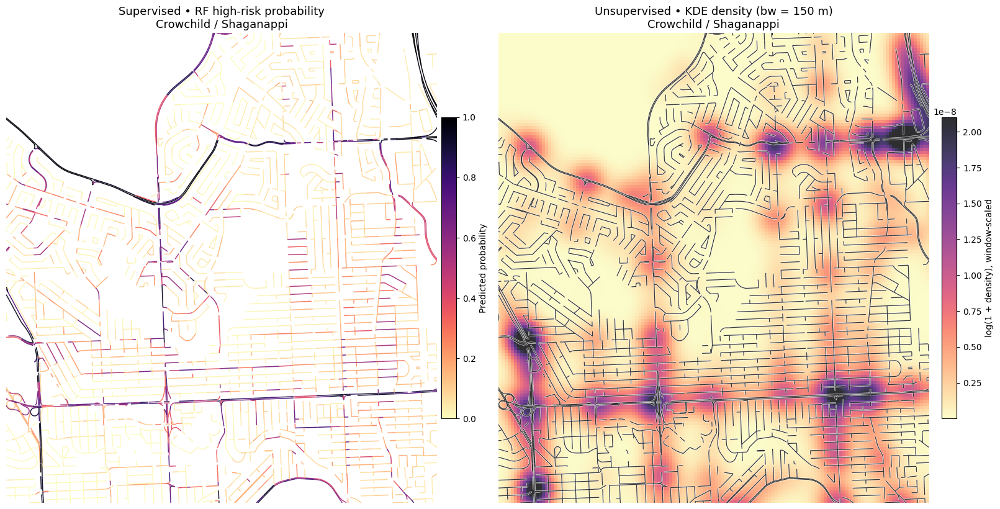

In [92]:
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import box
import geopandas as gpd
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Define the three zoom boxes (EPSG:32611 meters)
bboxes = {
    "Downtown / Beltline":            (704000, 5657500, 708000, 5662000),
    "Deerfoot (Anderson–Memorial)":   (710000, 5649000, 716000, 5655000),
    "Crowchild / Shaganappi":         (701500, 5660000, 707000, 5666000),
}

# Helper to subset roads quickly in meters CRS
def clip_roads(roads_m, bbox):
    xmin, ymin, xmax, ymax = bbox
    return roads_m.clip(box(xmin, ymin, xmax, ymax))

# Helper to slice the KDE raster to the bbox and make a local contrast norm
def slice_kde(XX, YY, Z, bbox):
    xmin, ymin, xmax, ymax = bbox
    ix = (XX[0] >= xmin) & (XX[0] <= xmax)      # columns
    iy = (YY[:,0] >= ymin) & (YY[:,0] <= ymax)  # rows
    Zsub = Z[iy][:, ix]
    XXsub = XX[iy][:, ix]
    YYsub = YY[iy][:, ix]
    # local percentile stretch for contrast
    zlo, zhi = np.nanpercentile(Zsub, [5, 99.5])
    norm = Normalize(vmin=zlo, vmax=zhi)
    return XXsub, YYsub, Zsub, norm

# Plot each zoom: left = RF probs, right = KDE
for title, bbox in bboxes.items():
    roads_clip = clip_roads(roads_m, bbox)

    XXsub, YYsub, Zsub, norm = slice_kde(XX, YY, Z, bbox)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 9), constrained_layout=True)

    # LEFT: RF predicted probability on segments
    # base context (very light grey)
    roads_clip.plot(ax=ax1, color="white", linewidth=2.2, alpha=0.85, zorder=1)  # halo
    roads_clip.plot(ax=ax1, column="rf_pred", cmap="magma_r",
                    linewidth=1.1, alpha=0.95, zorder=2, legend=False)

    ax1.set_xlim(bbox[0], bbox[2]); ax1.set_ylim(bbox[1], bbox[3])
    ax1.set_title(f"Supervised • RF high-risk probability\n{title}", fontsize=13)
    ax1.set_axis_off()

    sm1 = ScalarMappable(norm=Normalize(0,1), cmap="magma_r")
    cbar1 = fig.colorbar(sm1, ax=ax1, fraction=0.035, pad=0.01)
    cbar1.set_label("Predicted probability")

    # RIGHT: KDE heatmap with local stretch (uses your already-fit KDE)
# heatmap first (underlay)
    # Build incidents subset INSIDE the bbox and recompute KDE there
    # incidents_gdf must have 'point' in 4326. We'll project to meters.
    incidents_m = incidents_gdf.to_crs(32611)

    # bbox is (xmin,xmax,ymin,ymax) in meters (from your roads_m clip)
    poly_bbox = box(bbox[0], bbox[2], bbox[1], bbox[3])
    inc_sub_m = incidents_m[incidents_m.to_crs(32611).intersects(poly_bbox)].copy()

    # If very few incidents, you won’t see much contrast
    print("Incidents in window:", len(inc_sub_m))

    # Grid for this window (finer than before)
    cell = 40  # meters
    xx = np.arange(bbox[0], bbox[2] + cell, cell)
    yy = np.arange(bbox[1], bbox[3] + cell, cell)
    XXsub, YYsub = np.meshgrid(xx, yy)
    grid_xy = np.column_stack([XXsub.ravel(), YYsub.ravel()])

    # KDE on the window points only; try a smaller bw to increase contrast
    bandwidth = 150  # try 100–250
    kde = KernelDensity(bandwidth=bandwidth, kernel="gaussian")
    coords_sub = np.column_stack([inc_sub_m.geometry.x.values, inc_sub_m.geometry.y.values])

    if len(coords_sub) >= 2:
        kde.fit(coords_sub)
        Zsub = np.exp(kde.score_samples(grid_xy)).reshape(YYsub.shape)

        # Contrast stretch: log + percentile limits within this window
        Zplot = np.log1p(Zsub)
        vals = Zplot[np.isfinite(Zplot)]
        vmin = np.percentile(vals, 5)
        vmax = np.percentile(vals, 99.5)
        norm = Normalize(vmin=vmin, vmax=vmax)

        # Heatmap
        im = ax2.imshow(
            Zplot, origin="lower",
            extent=[bbox[0], bbox[2], bbox[1], bbox[3]],
            cmap="magma_r", norm=norm, alpha=0.82, zorder=1
        )

        # Roads overlay (halo + stroke so lines pop)
        roads_clip.plot(ax=ax2, color="white", linewidth=1.8, alpha=0.85, zorder=3)   # halo
        roads_clip.plot(ax=ax2, color="#2b2b2b", linewidth=0.9, alpha=0.95, zorder=4) # stroke


        # Safe contours (skip if flat)
        spread = vmax - vmin
        if spread > 1e-6:
            levels = np.linspace(vmin, vmax, 10)
            ax2.contour(XXsub, YYsub, Zplot, levels=levels,
                        colors="white", linewidths=0.5, alpha=0.6, zorder=4)

        ax2.set_xlim(bbox[0], bbox[2]); ax2.set_ylim(bbox[1], bbox[3])
        ax2.set_title(f"Unsupervised • KDE density (bw = {bandwidth} m)\n{title}", fontsize=13)
        ax2.set_axis_off()
        cbar2 = fig.colorbar(im, ax=ax2, fraction=0.035, pad=0.01)
        cbar2.set_label("log(1 + density), window-scaled")

    else:
        ax2.text(0.5, 0.5, "Too few incidents in this window",
                transform=ax2.transAxes, ha="center", va="center")
        ax2.set_axis_off()
    plt.show()


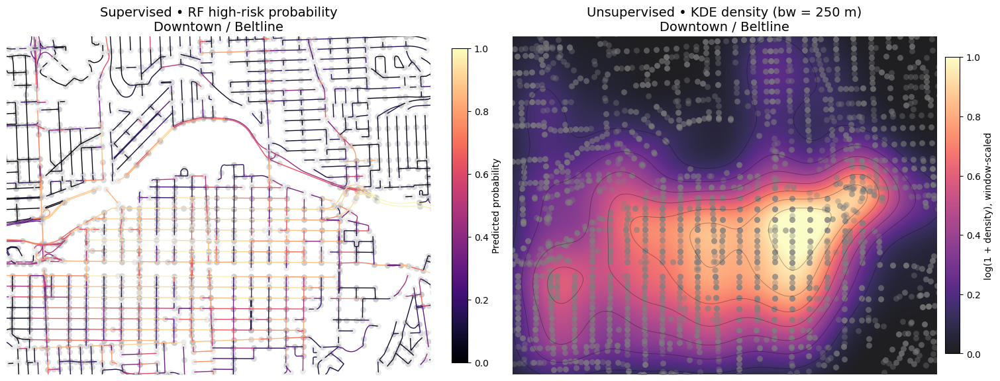

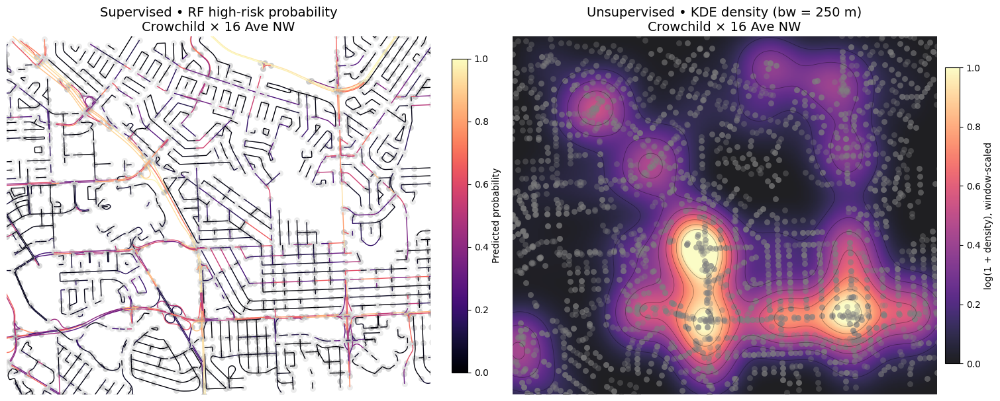

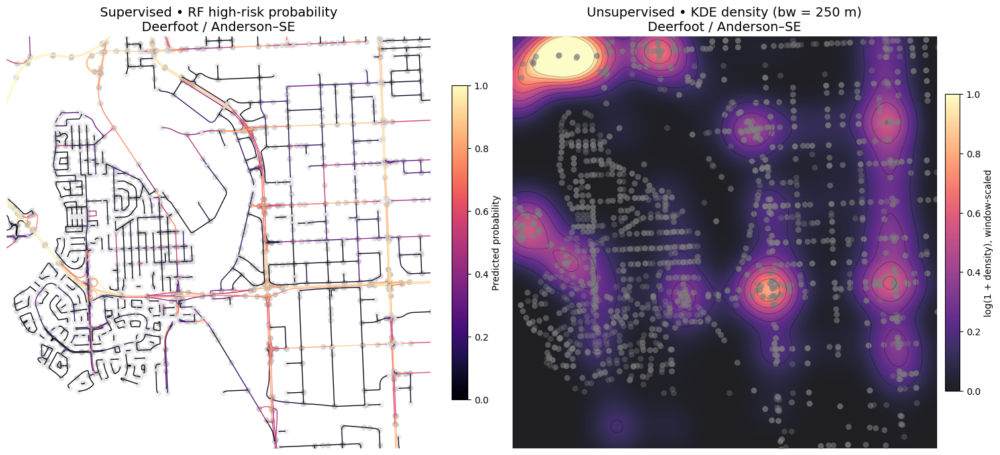

In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import geopandas as gpd
from shapely.geometry import box
from sklearn.neighbors import KernelDensity

# Areas of interest (EPSG:4326)
aoi_boxes = {
    # Downtown / Beltline
    "Downtown / Beltline": box(-114.10, 51.035, -114.04, 51.065),
    # Crowchild x 16 Ave NW / University District
    "Crowchild × 16 Ave NW": box(-114.15, 51.060, -114.08, 51.095),
    # Deerfoot / Anderson – SE corridor
    "Deerfoot / Anderson–SE": box(-114.03, 50.960, -113.95, 51.010),
}

if "rf_pred" not in road_segments_filtered.columns:
    # If you already have best_rf & feature matrix X, use them; else skip this section
    # and compute rf_pred earlier like you did during tuning.
    gdf_base = road_segments_filtered.copy()
    # Rebuild features exactly like you used for grid search (num_cols + cat_cols)
    num_cols = [c for c in ["aawt_weekday","aawt_weekend","length_km","is_major_road","x_m","y_m","p_peak_hours","p_public_holiday"] if c in gdf_base.columns]
    cat_cols = [c for c in ["ctp_class","one_way","ownership","octant"] if c in gdf_base.columns]
    X = gdf_base[num_cols + cat_cols]  # ColumnTransformer in your pipeline will select correctly
    road_segments_filtered["rf_pred"] = grid_rf.best_estimator_.predict_proba(X)[:, 1]

# make one figure per Area of interest
for aoi_name, aoi_poly_4326 in aoi_boxes.items():
    # Subset segments & incidents by AOI (4326), then project to meters (32611)
    seg_sub = road_segments_filtered[road_segments_filtered.to_crs(4326).intersects(aoi_poly_4326)].copy()
    inc_sub = incidents_gdf[incidents_gdf.to_crs(4326).intersects(aoi_poly_4326)].copy()

    seg_m = seg_sub.to_crs(32611)
    inc_m = inc_sub.to_crs(32611)

    # Left panel: RF probabilities along segments (same style you used)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8), constrained_layout=True)
    ax1.set_title(f"Supervised • RF high-risk probability\n{aoi_name}", fontsize=14)

    # nice thin lines colored by rf_pred
    vmin, vmax = 0.0, 1.0
    seg_m.plot(
        ax=ax1, column="rf_pred", cmap="magma", linewidth=1.0,
        vmin=vmin, vmax=vmax, legend=True,
        legend_kwds={"shrink": 0.6, "label": "Predicted probability"}
    )
    # faint basemap of all segments in AOI for context (optional)
    seg_m.boundary.plot(ax=ax1, color="grey", linewidth=0.2, alpha=0.15)

    # ===== Right panel: KDE with glowing hotspots (same look as original) =====
    ax2.set_title(f"Unsupervised • KDE density (bw = 250 m)\n{aoi_name}", fontsize=14)

    # If very few incidents, fall back to an empty heat; otherwise compute KDE
    bandwidth = 250  # meters (keep this constant to match your original look)
    nx, ny = 250, 250  # grid resolution per AOI (balance detail & speed)

    # Determine bounds from incidents if present; otherwise from segments
    if len(inc_m) > 0:
        minx, miny, maxx, maxy = inc_m.total_bounds
    else:
        minx, miny, maxx, maxy = seg_m.total_bounds

    # Guard against degenerate extents
    pad = 50  # meters of padding
    if maxx - minx < 2 * pad or maxy - miny < 2 * pad:
        minx, maxx = minx - pad, maxx + pad
        miny, maxy = miny - pad, maxy + pad

    # Build grid & evaluate KDE
    xx, yy = np.meshgrid(
        np.linspace(minx, maxx, nx),
        np.linspace(miny, maxy, ny)
    )
    grid_xy = np.vstack([xx.ravel(), yy.ravel()]).T

    if len(inc_m) > 0:
        coords = np.vstack([inc_m.geometry.x, inc_m.geometry.y]).T
        kde = KernelDensity(bandwidth=bandwidth, kernel="gaussian")
        kde.fit(coords)
        dens = np.exp(kde.score_samples(grid_xy)).reshape(xx.shape)
    else:
        dens = np.zeros(xx.shape, dtype=float)

    # Local “glow” normalization (log1p + local min/max)
    dens_log = np.log1p(dens)
    p5, p99 = np.nanpercentile(dens_log, [5, 99]) if np.isfinite(dens_log).any() else (0.0, 1.0)
    if p99 <= p5:  # avoid zero division
        p99 = p5 + 1e-6
    dens_norm = np.clip((dens_log - p5) / (p99 - p5), 0, 1)

    # Heatmap
    im = ax2.imshow(
        dens_norm, origin="lower",
        extent=(minx, maxx, miny, maxy),
        cmap="magma", alpha=0.88, aspect="equal"
    )
    cbar = plt.colorbar(im, ax=ax2, fraction=0.035, pad=0.02)
    cbar.set_label("log(1 + density), window-scaled")

    # Contours on the same normalized scale
    levels = np.linspace(0.15, 0.95, 7)
    ax2.contour(
        xx, yy, dens_norm, levels=levels,
        colors="k", linewidths=0.6, alpha=0.35
    )

    # Overlay road lines for map context
    seg_m.boundary.plot(ax=ax2, color="grey", linewidth=0.25, alpha=0.35)

    # Harmonize extents & remove axes clutter
    for ax in (ax1, ax2):
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
        ax.set_axis_off()

    plt.show()


##### Report

An expanded version of your presentation including details of your analysis. Explain how you arrived at your "best model", and how its performance compares to other models you tried. Your report should stand alone and be readable independent of your presentation.

What question you are studying and why we should care about it.
What dataset(s) you're using to tackle the question.
What metric(s) you used to make modelling decisions, and why you chose these metrics.
What preprocessing and modelling techniques were most successful for answering your question. (Stick to your "best model".)
Results of you analysis. Limitations of your analysis.
How you might, hypothetically, follow up on your results. Next steps.

AAWt by road classes

Road classes proportions in incidents

Random forest classifier

Density maps/predictions for all of calgary

Use join distance of 500 m

Labelled map of calgary